In [1]:
import os
import numpy as np
import scanpy as sc
import anndata as ad
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
plt.rcParams['figure.figsize']=(5, 5)
plt.rcParams['figure.dpi'] = 100
sc.settings.verbosity = 3
sc.logging.print_versions()

%load_ext autoreload
%autoreload 2 

scanpy==1.4.4.post1 anndata==0.7.4 umap==0.3.10 numpy==1.19.2 scipy==1.5.2 pandas==1.1.2 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.8.2 louvain==0.6.1


In [2]:
import rpy2.rinterface_lib.callbacks
import logging
import warnings
from rpy2.robjects import pandas2ri
import anndata2ri

# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
warnings.filterwarnings("ignore")

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [3]:
%%R
# Load all the R libraries we will be using in the notebook
library(scran)
sessionInfo()

R version 3.6.2 (2019-12-12)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Debian GNU/Linux 10 (buster)

Matrix products: default
BLAS:   /app/R36/lib/R/lib/libRblas.so
LAPACK: /app/R36/lib/R/lib/libRlapack.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
 [1] parallel  stats4    tools     stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] scran_1.14.6                SingleCellExperiment_1.8.0 
 [3] SummarizedExperiment_1.16.1 DelayedArray_0.12.3        
 [5] BiocParallel_1.20.1         matrixStats_0.56.0         
 [7] Biobase_2.46.0              GenomicRanges_1.38.0       
 [9] GenomeInf

# Dataloading

In [4]:
adatas = []

data_file = './../../data/raw/MUC10103/filtered_gene_bc_matrices/mm10/matrix.mtx'
barcode_file = './../../data/raw/MUC10103/filtered_gene_bc_matrices/mm10/barcodes.tsv'
gene_file = './../../data/raw/MUC10103/filtered_gene_bc_matrices/mm10/genes.tsv'

adata = sc.read(data_file, cache=True)
adata = adata.transpose()
#adata.X = adata.X.toarray()

barcodes = pd.read_csv(barcode_file, header=None, sep='\t')
genes = pd.read_csv(gene_file, header=None, sep='\t')

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata.obs = barcodes
adata.obs['tissue'] = 'Pituitary'
adata.obs['condition'] = 'Control'
genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata.var = genes
adata.var_names_make_unique()
adatas.append(adata)

##############################################################################################
data_file = './../../data/raw/MUC10104/filtered_gene_bc_matrices/mm10/matrix.mtx'
barcode_file = './../../data/raw/MUC10104/filtered_gene_bc_matrices/mm10/barcodes.tsv'
gene_file = './../../data/raw/MUC10104/filtered_gene_bc_matrices/mm10/genes.tsv'

adata = sc.read(data_file, cache=True)
adata = adata.transpose()
#adata.X = adata.X.toarray()

barcodes = pd.read_csv(barcode_file, header=None, sep='\t')
genes = pd.read_csv(gene_file, header=None, sep='\t')

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata.obs = barcodes
adata.obs['tissue'] = 'Pituitary'
adata.obs['condition'] = 'Stress'
genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata.var = genes
adata.var_names_make_unique()
adatas.append(adata)
print(adata, adatas[0])
adata = adatas[0].concatenate(adatas[1:])
print(adata)

del adatas

... reading from cache file cache/..-..-data-raw-MUC10103-filtered_gene_bc_matrices-mm10-matrix.h5ad
... reading from cache file cache/..-..-data-raw-MUC10104-filtered_gene_bc_matrices-mm10-matrix.h5ad
AnnData object with n_obs × n_vars = 5103 × 27998
    obs: 'tissue', 'condition'
    var: 'gene_id' AnnData object with n_obs × n_vars = 5202 × 27998
    obs: 'tissue', 'condition'
    var: 'gene_id'
AnnData object with n_obs × n_vars = 10305 × 27998
    obs: 'tissue', 'condition', 'batch'
    var: 'gene_id'


In [5]:
print(adata.obs['condition'].value_counts())
print('')

Control    5202
Stress     5103
Name: condition, dtype: int64



# QC

In [6]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
adata.obs['mt_frac'] = np.asarray(adata.X[:, np.flatnonzero(mt_gene_mask)].sum(1)).flatten()/adata.obs['n_counts']

... storing 'tissue' as categorical
... storing 'condition' as categorical


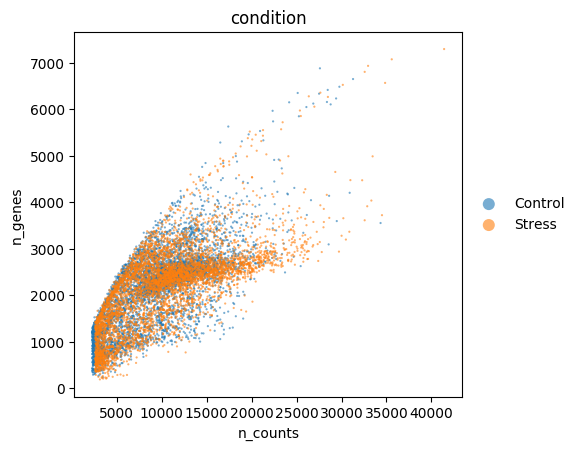

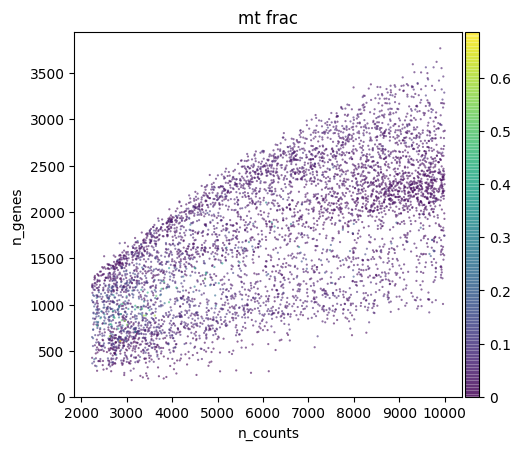

In [7]:
#Data quality summary plots
plt.rcParams['figure.figsize'] = (5, 5)
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', size=10, color='condition', alpha=0.6)
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac', size=10, alpha=0.6)

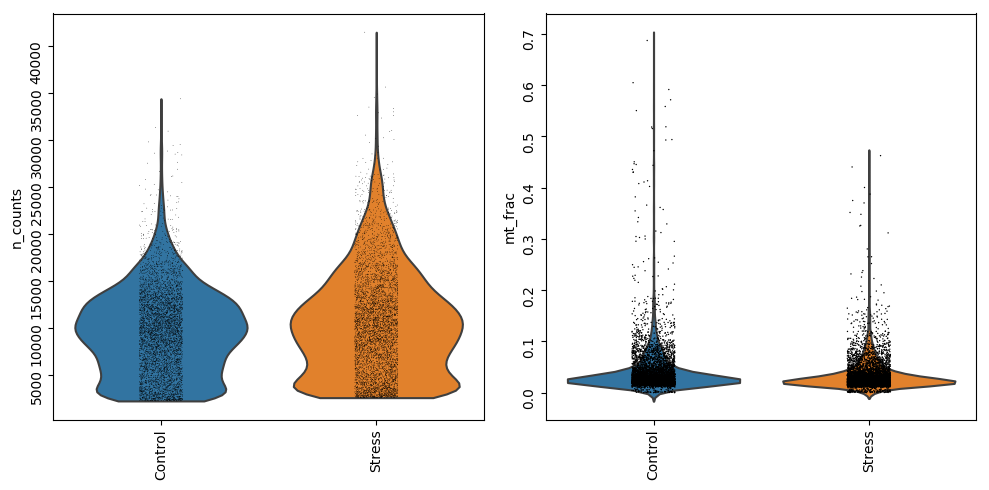

In [8]:
# Quality control - plot QC metrics
#Sample quality plots
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
t1 = sc.pl.violin(adata, 'n_counts', groupby='condition', size=0.5, log=False, cut=0, rotation=90, show=False, ax=ax[0])
t4 = sc.pl.violin(adata, 'mt_frac', groupby='condition', rotation=90, show=False, ax=ax[1])
fig.tight_layout()

Text(0.5, 0.98, 'Count distribution')

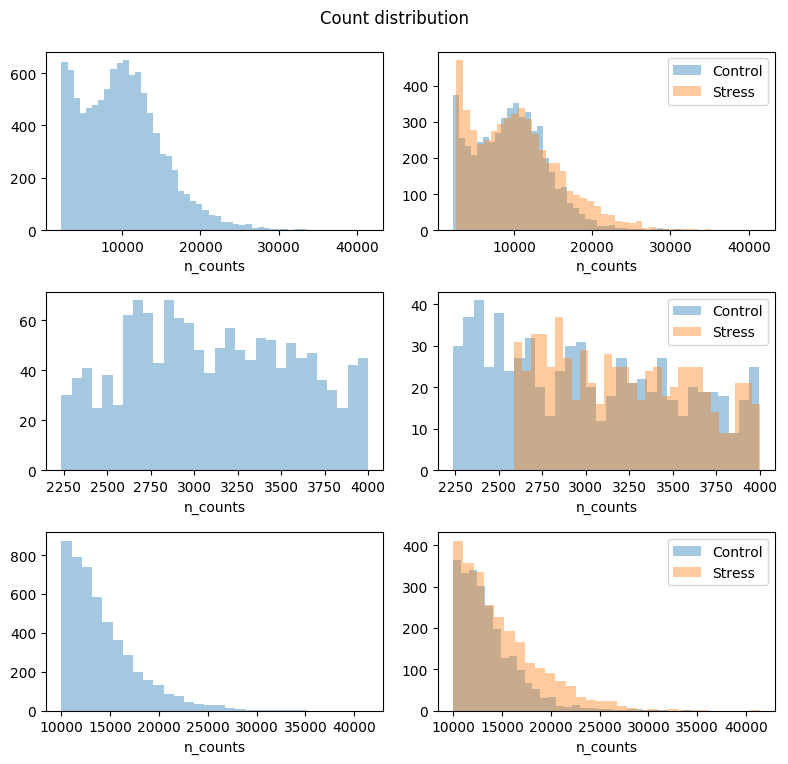

In [9]:
#Thresholding decision: counts
fig, ax = plt.subplots(3, 2, figsize=(8, 8))
sns.distplot(adata.obs['n_counts'], kde=False, ax=ax[0, 0])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Control'], kde=False, ax=ax[0, 1])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Stress'], kde=False, ax=ax[0, 1])
ax[0, 1].legend(['Control', 'Stress'])

sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=30, ax=ax[1, 0])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Control'][adata.obs['n_counts']<4000], kde=False, bins=30, ax=ax[1, 1])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Stress'][adata.obs['n_counts']<4000], kde=False, bins=30, ax=ax[1, 1])
ax[1, 1].legend(['Control', 'Stress'])

sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=30, ax=ax[2, 0])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Control'][adata.obs['n_counts']>10000], kde=False, bins=30, ax=ax[2, 1])
sns.distplot(adata.obs['n_counts'][adata.obs['condition']=='Stress'][adata.obs['n_counts']>10000], kde=False, bins=30, ax=ax[2, 1])
ax[2, 1].legend(['Control', 'Stress'])

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.suptitle('Count distribution')

Text(0.5, 0.98, 'Gene distribution')

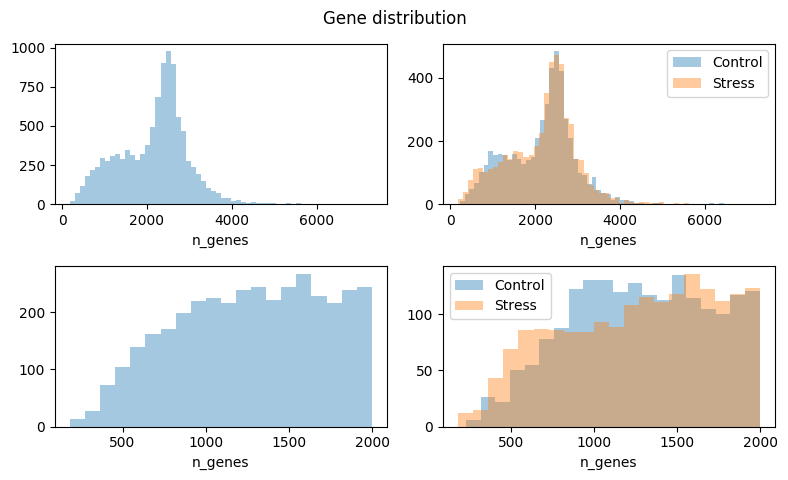

In [10]:
# Thresholding decision: genes
fig, ax = plt.subplots(2, 2, figsize=(8, 5))
sns.distplot(adata.obs['n_genes'], kde=False, bins=60, ax=ax[0, 0])
sns.distplot(adata.obs['n_genes'][adata.obs['condition']=='Control'], kde=False, bins=60, ax=ax[0, 1])
sns.distplot(adata.obs['n_genes'][adata.obs['condition']=='Stress'], kde=False, bins=60, ax=ax[0, 1])
ax[0, 1].legend(['Control', 'Stress'])

sns.distplot(adata.obs['n_genes'][adata.obs['n_genes']<2000], kde=False, bins=20, ax=ax[1, 0])
sns.distplot(adata.obs['n_genes'][adata.obs['condition']=='Control'][adata.obs['n_genes']<2000], kde=False, bins=20, ax=ax[1, 1])
sns.distplot(adata.obs['n_genes'][adata.obs['condition']=='Stress'][adata.obs['n_genes']<2000], kde=False, bins=20, ax=ax[1, 1])
ax[1, 1].legend(['Control', 'Stress'])

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.suptitle('Gene distribution')

Text(0.5, 0.98, 'Mitochondrial gene fraction dist.')

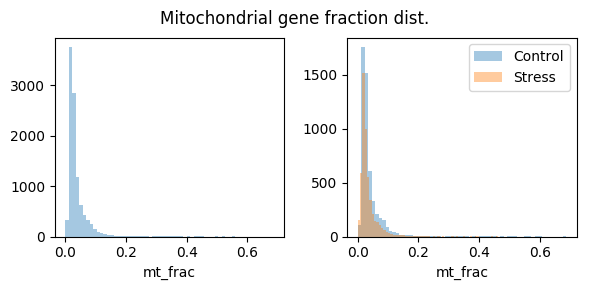

In [11]:
#Thresholding decision: genes
fig, ax = plt.subplots(1, 2, figsize=(6, 3))
sns.distplot(adata.obs['mt_frac'], kde=False, bins=60, ax=ax[0])
sns.distplot(adata.obs['mt_frac'][adata.obs['condition']=='Control'], kde=False, bins=60, ax=ax[1])
sns.distplot(adata.obs['mt_frac'][adata.obs['condition']=='Stress'], kde=False, bins=60, ax=ax[1])
ax[1].legend(['Control', 'Stress'])
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.suptitle('Mitochondrial gene fraction dist.')

In [12]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 1000)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.25]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 400)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Total number of cells: 10305
Number of cells after min count filter: 10305
Number of cells after MT filter: 10245
filtered out 74 cells that haveless than 400 genes expressed


Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 10171


In [13]:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 27998
filtered out 12561 genes that are detectedin less than 20 cells
Number of genes after cell filter: 15437


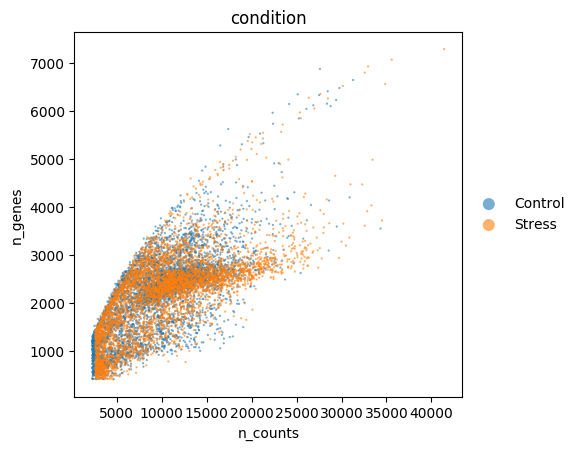

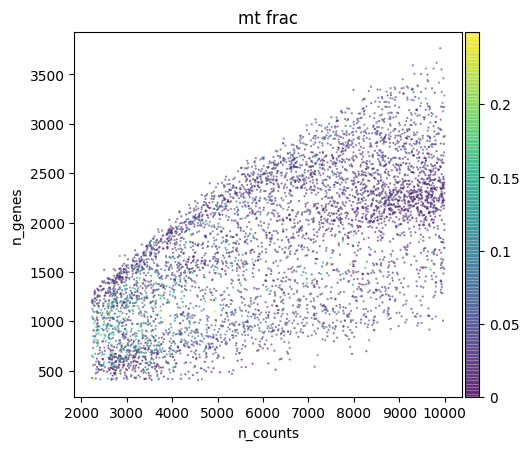

In [14]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', size=10, color='condition', alpha=0.6)
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac', size=10, alpha=0.6)

In [15]:
import scrublet as scr
scrub = scr.Scrublet(adata.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
adata.obs['doublet_scores'] = doublet_scores
adata.obs['predicted_doublets'] = predicted_doublets

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.46
Detected doublet rate = 2.9%
Estimated detectable doublet fraction = 36.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 7.8%
Elapsed time: 19.1 seconds


(<Figure size 800x300 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4e94129510>,
       dtype=object))

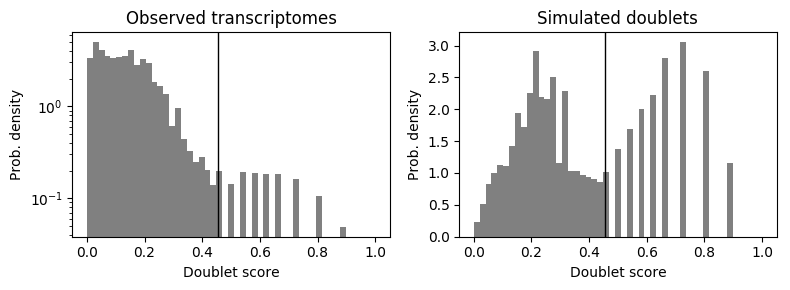

In [16]:
scrub.plot_histogram()

In [17]:
adata = adata[~adata.obs['predicted_doublets']]
print('Number of cells after doublet filter: {:d}'.format(adata.n_obs))

Number of cells after doublet filter: 9879


# Normalization

In [18]:
#Perform a clustering for scran normalization in clusters
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


/app/python37/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:284: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if isinstance(data, AnnData) and data.isview:


Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 15
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 15


/app/python37/lib/python3.7/site-packages/scanpy/neighbors/__init__.py:89: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview:  # we shouldn't need this here...


    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:11)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:01)


In [19]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata.X.T

/app/python37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [20]:
%%R -i data_mat -i input_groups -o size_factors

size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

Trying to set attribute `.obs` of view, copying.


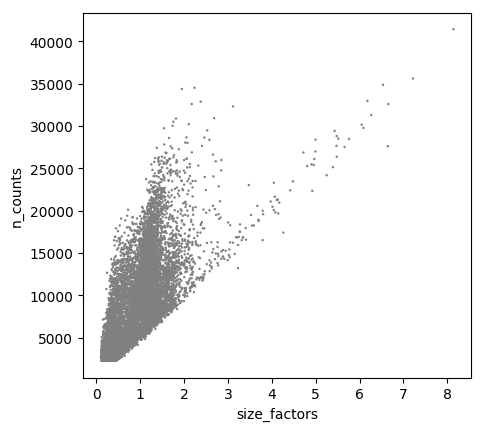

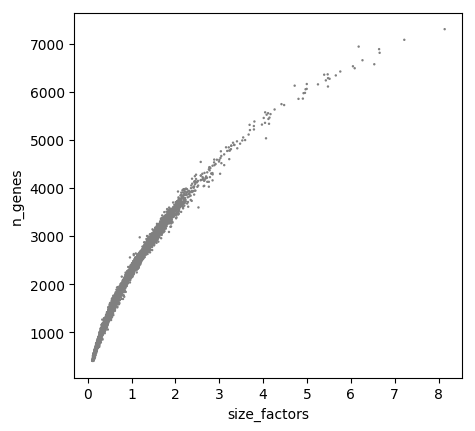

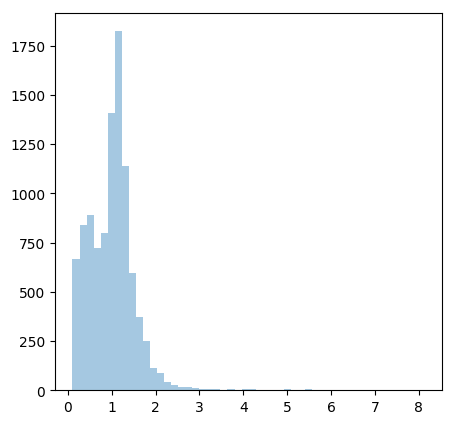

In [21]:
# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors

sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')

sns.distplot(size_factors, bins=50, kde=False)
plt.show()

In [22]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

In [23]:
#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
sc.pp.log1p(adata)

/app/python37/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:284: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if isinstance(data, AnnData) and data.isview:


In [24]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

/app/python37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Batch correction

In [25]:
# ComBat batch correction
sc.pp.combat(adata, key='condition')

Standardizing Data across genes.

Found 2 batches

Found 0 numerical variables:
	



/app/python37/lib/python3.7/site-packages/patsy/constraint.py:13: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Mapping


Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



# HVG

In [26]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

/app/python37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


extracting highly variable genes
    finished (0:00:40)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


/app/python37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


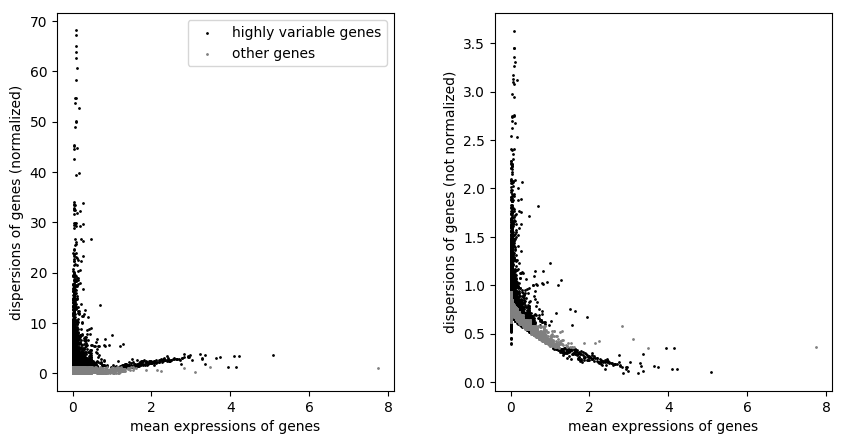

In [27]:
sc.pl.highly_variable_genes(adata)

# Dimensionality reduction

In [28]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.tsne(adata, n_jobs=12)
sc.tl.umap(adata)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:25)
computing neighbors
    using 'X_pca' with n_pcs = 50


/app/python37/lib/python3.7/site-packages/scanpy/neighbors/__init__.py:89: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview:  # we shouldn't need this here...


    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:08)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:40)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)


# Cell cycle scoring

In [ ]:
#Score cell cycle and visualize the effect:
cc_genes_file = '../MRGR_Stress/Macosko_cell_cycle_genes.txt'
cc_genes = pd.read_table(cc_genes_file, delimiter='\t')
s_genes = cc_genes['S'].dropna()
g2m_genes = cc_genes['G2.M'].dropna()

s_genes_mm = [gene.lower().capitalize() for gene in s_genes]
g2m_genes_mm = [gene.lower().capitalize() for gene in g2m_genes]

s_genes_mm_ens = adata.var_names[np.in1d(adata.var_names, s_genes_mm)]
g2m_genes_mm_ens = adata.var_names[np.in1d(adata.var_names, g2m_genes_mm)]

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes_mm_ens, g2m_genes=g2m_genes_mm_ens)

In [ ]:
sc.pl.umap(adata, color=['S_score', 'G2M_score'], use_raw=False)
sc.pl.umap(adata, color='phase', use_raw=False)

# Clustering

In [29]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.5, key_added='louvain_r0.5')

running Louvain clustering


/app/python37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


    using the "louvain" package of Traag (2017)
    finished: found 21 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:01)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:01)


In [30]:
adata.obs['louvain_r0.5'].value_counts()

0     4331
1     1885
2      833
3      640
4      345
5      341
6      273
7      257
8      226
9      214
10     157
11     142
13      83
12      83
14      44
15      25
Name: louvain_r0.5, dtype: int64

In [ ]:
adata.write('./../../data/processed/pituitary.h5ad')

# Analysis

In [6]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.5, key_added='louvain_r0.5', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 22 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:01)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:00)


In [35]:
adata.obs['louvain_r0.5'].value_counts()

0     4295
1     2166
2      857
3      497
4      345
5      342
6      265
7      242
8      226
9      184
10     154
11     140
13      83
12      83
Name: louvain_r0.5, dtype: int64

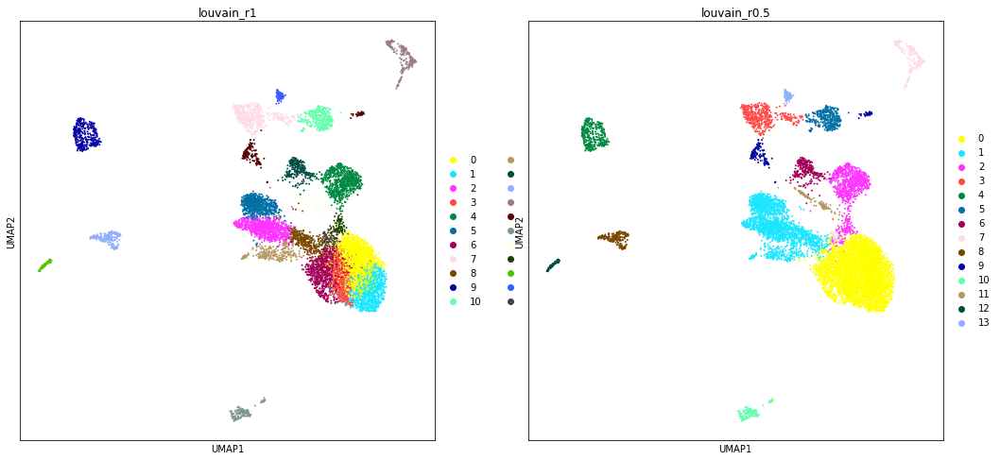

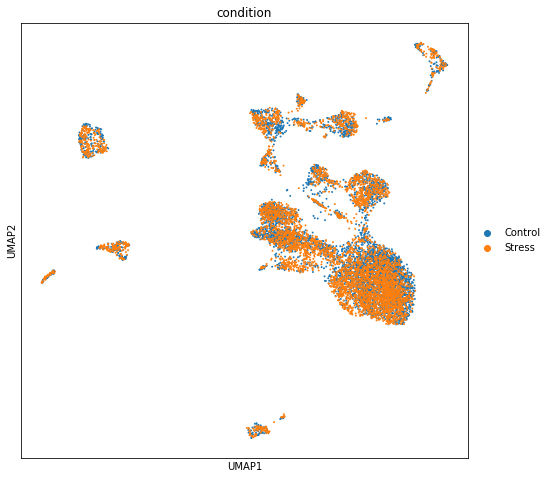

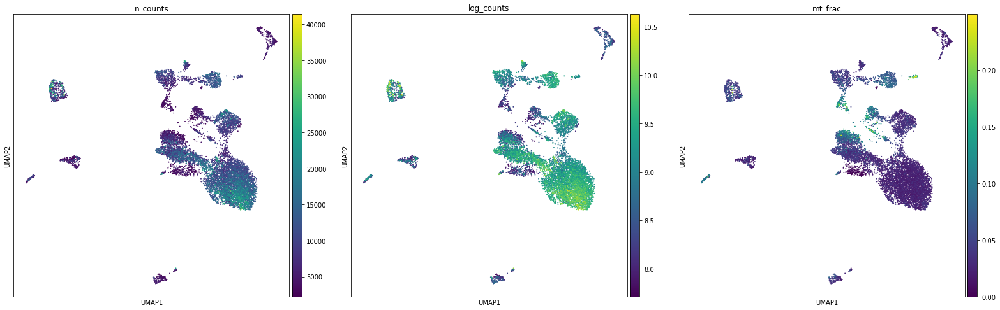

In [36]:
#Visualize the clustering and how this is reflected by different technical covariates
plt.rcParams['figure.figsize'] = (8, 8)
sc.pl.umap(adata, color=['louvain_r1', 'louvain_r0.5'], size=15, palette=sc.pl.palettes.default_64, save='clusters.png')
sc.pl.umap(adata, color=['condition'], size=15, save='conditions.png')
sc.pl.umap(adata, color=['n_counts', 'log_counts', 'mt_frac'], size=15, save='technical_vars.png')

# Marker genes

In [3]:
#Calculate marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r1', key_added='rank_genes_r1')

ranking genes
    finished (0:00:20)


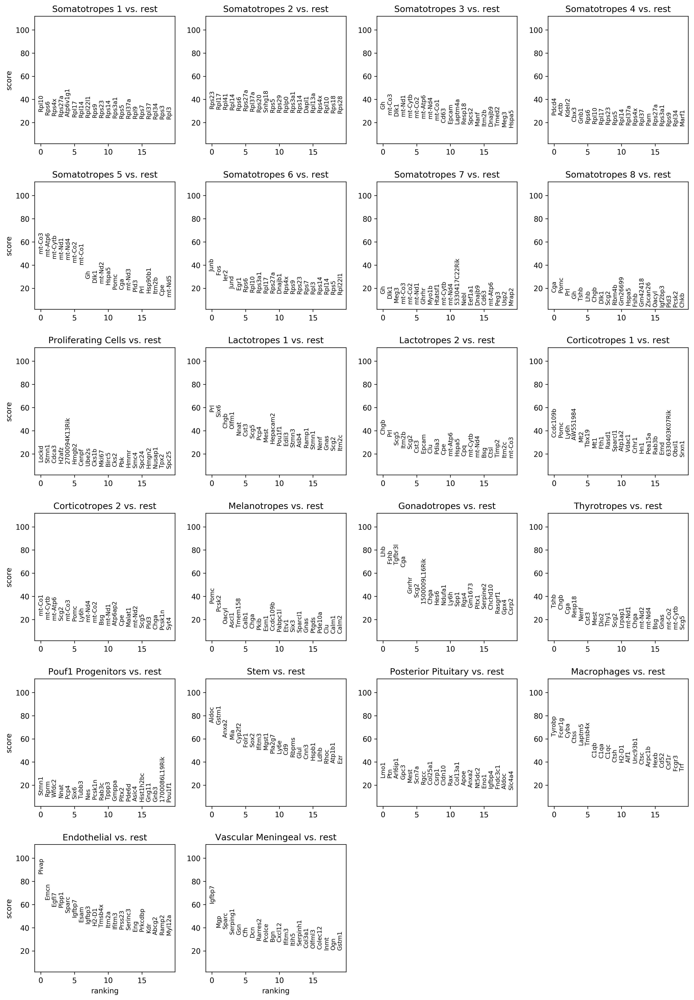

In [35]:
plt.rcParams['figure.figsize'] = (4,4)
sc.pl.rank_genes_groups(adata, key='rank_genes_r1', save='_pituitary.png')

In [4]:
writer = pd.ExcelWriter('pituitary_r1_markers_pval.xlsx', engine='xlsxwriter')
names = adata.uns['rank_genes_r1']['names']
scores = adata.uns['rank_genes_r1']['scores']
pval = adata.uns['rank_genes_r1']['pvals']
adjp = adata.uns['rank_genes_r1']['pvals_adj']
foldchanges = adata.uns['rank_genes_r1']['logfoldchanges']
for clust in adata.obs['louvain_r1'].cat.categories:
        pd.DataFrame({'Names':names[clust],
                      'Scores':scores[clust],
                      'pval': pval[clust],
                      'adj_pval': adjp[clust],
                      'Log2foldchanges':foldchanges[clust]}).to_excel(writer,sheet_name=clust)
writer.save()

del scores, names, writer, foldchanges, clust

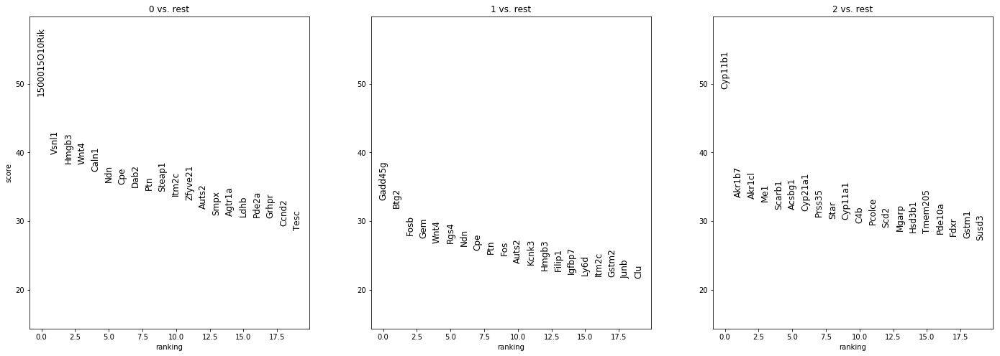

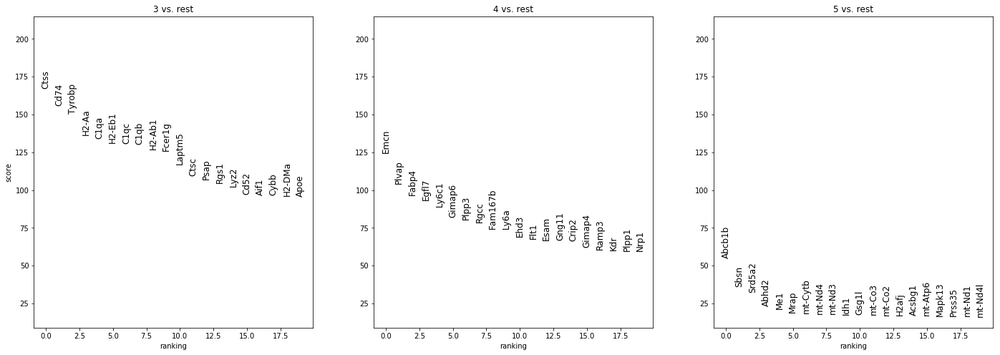

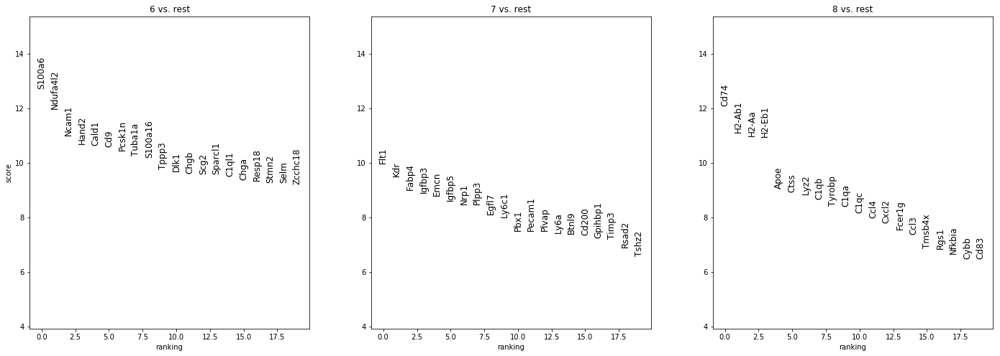

ValueError: no field of name 10

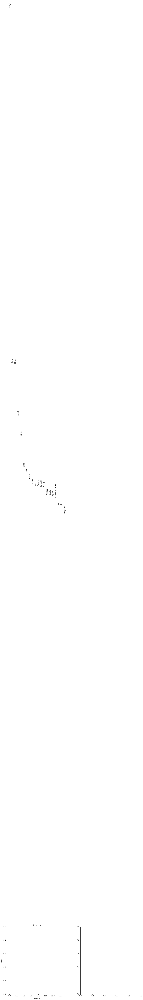

In [36]:
#Plot marker genes
n_groups=12
for i in np.arange(0, n_groups, 3):
    sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=[str(i),str(i+1),str(i+2)], fontsize=12)

In [5]:
marker_genes = dict()
filepath = './data/pituitary_markers.txt'
with open(filepath) as fp:
    for cnt, line in enumerate(fp):
        if cnt > 0:
            gene, cell= line.split('\t')
            cell = cell.rstrip('\n')
            print(gene, cell)
            if cell not in set(marker_genes.keys()):
                marker_genes[cell] = [gene]
            else:
                marker_genes[cell].append(gene)

Gh Somatotropes
Ghrhr Somatotropes
Agtr1a Lactotropes
Prl Lactotropes
Dio2 Thyrotropes
Trhr Thyrotropes
Tshb Thyrotropes
Fshb Gonadotropes
Gata2 Gonadotropes
Lhb Gonadotropes
Nr5a1 Gonadotropes
Crhr1 Corticotropes
Gpc5 Corticotropes
Gpc5 Melanotropes
Nr3c1 Corticotropes
Pomc Corticotropes
Pomc Melanotropes
Oacyl Melanotropes
Pax7 Melanotropes
Cga Progenitor Cells
Pou1f1 Progenitor Cells
Tbx19 Progenitor Cells
Emcn Endothelial Cells
Igfbp3 Endothelial Cells
Kdr Endothelial Cells
Pecam1 Endothelial Cells
Plvap Endothelial Cells
Apod Vascular Meningeal Cells
Dcn Vascular Meningeal Cells
Efemp1 Vascular Meningeal Cells
Mfap4 Vascular Meningeal Cells
Cspg4 Pericytes
Mgp Pericytes
P2ry14 Pericytes
Pdgfrb Pericytes
Cyp2f2 Stem Cells
Folr1 Stem Cells
Jun Stem Cells
Lgr4 Stem Cells
Ly6a Stem Cells
Ly6e Stem Cells
Prop1 Stem Cells
Sox2 Stem Cells
Sox9 Stem Cells
Wwtr1 Stem Cells
Yap1 Stem Cells
Aif1 Macrophages
C1qa Macrophages
C1qb Macrophages
C1qc Macrophages
Ccrl2 Macrophages
Cd14 Macrophages

In [37]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r1')
cell_annotation

,Somatotropes 1,Somatotropes 2,Somatotropes 3,Somatotropes 4,Somatotropes 5,Somatotropes 6,Somatotropes 7,Somatotropes 8,Proliferating Cells,Lactotropes 1,...,Corticotropes 2,Melanotropes,Gonadotropes,Thyrotropes,Pouf1 Progenitors,Stem,Posterior Pituitary,Macrophages,Endothelial,Vascular Meningeal
Somatotropes,1.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Lactotropes,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Thyrotropes,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
Gonadotropes,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,...,2.0,0.0,4.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Corticotropes,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Melanotropes,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,...,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Progenitor Cells,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
Endothelial Cells,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0
Vascular Meningeal Cells,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
Pericytes,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


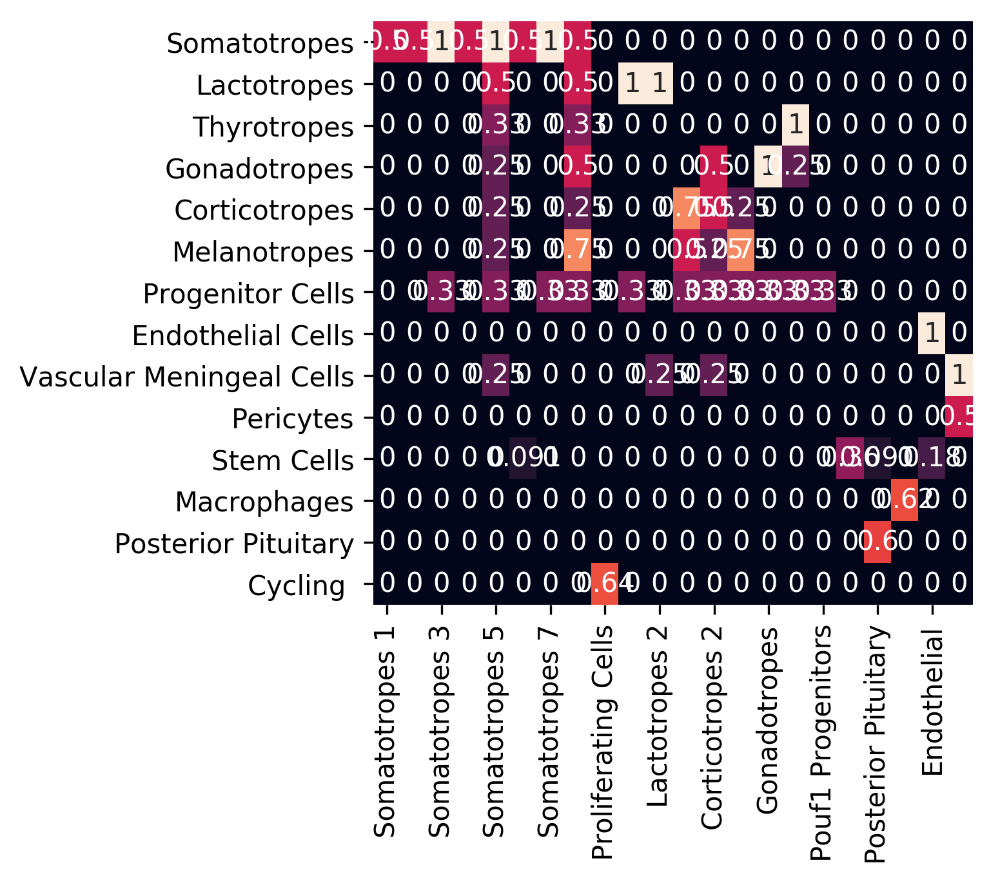

In [38]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r1', normalize='reference')
sns.heatmap(cell_annotation_norm, cbar=False, annot=True)

In [22]:
adata.rename_categories('louvain_r1', ['Somatotropes 1', 'Somatotropes 2', 'Somatotropes 3', 'Somatotropes 4', 'Lactotropes 1', 'Somatotropes 5',\
                                         'Somatotropes 6', 'Corticotropes 1', 'Somatotropes 7', 'Stem', 'Gonadotropes', 'Somatotropes 8', 'Lactotropes 2',\
                                         'Endothelial', 'Macrophages', 'Corticotropes 2', 'Vascular Meningeal', 'Thyrotropes', 'Progenitor',\
                                         'Posterior Pituitary', 'Melanotropes 2', 'Cycling'])

In [19]:
adata.obs['louvain_r1'].value_counts()

Somatotropes 1         1633
Somatotropes 2         1076
Somatotropes 3          914
Somatotropes 4          803
Lactotropes 1           725
Somatotropes 5          702
Somatotropes 6          693
Corticotropes 1         500
Somatotropes 7          391
Stem                    345
Gonadotropes            338
Melanotropes            265
Lactotropes 2           252
Endothelial             226
Macrophages             214
Corticotropes 2         186
Vascular Meningeal      155
Thyrotropes             144
Progenitor              126
Melanotropes 2           83
Posterior Pituitary      83
Cycling                  25
Name: louvain_r1, dtype: int64

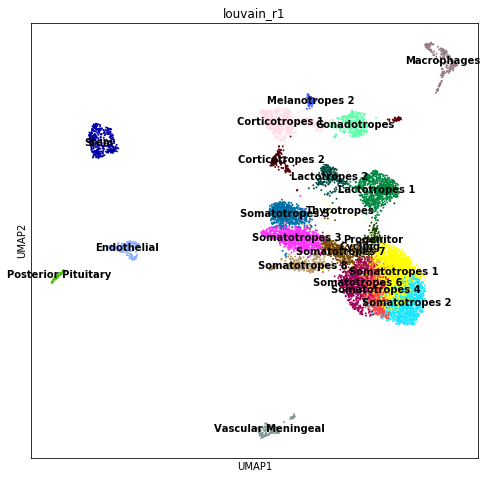

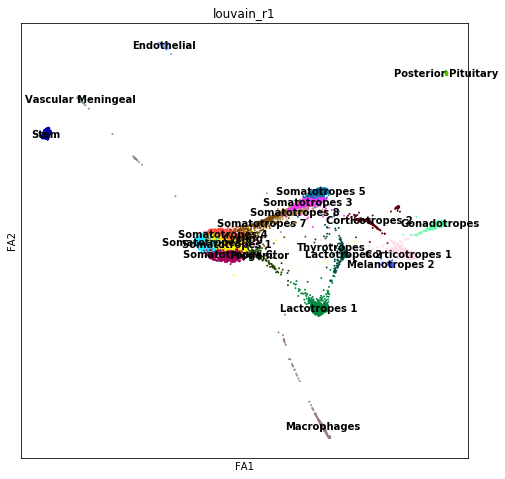

In [23]:
plt.rcParams['figure.figsize']=(8, 8)
sc.pl.umap(adata, color='louvain_r1', size=15, legend_loc='on data')
sc.pl.draw_graph(adata, color='louvain_r1', size=15, legend_loc='on data')

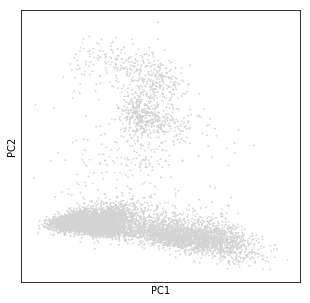

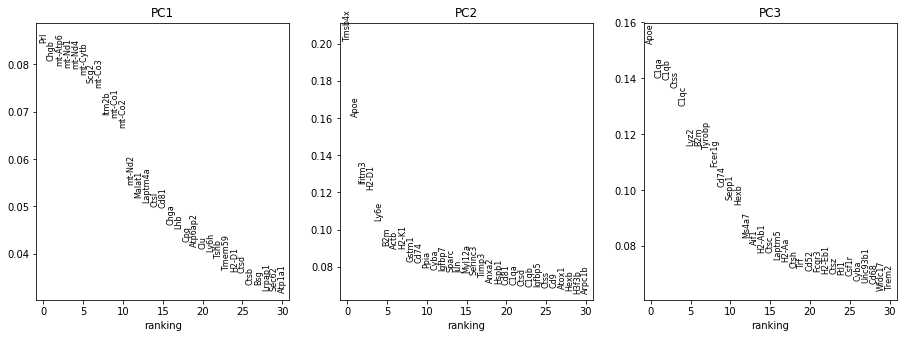

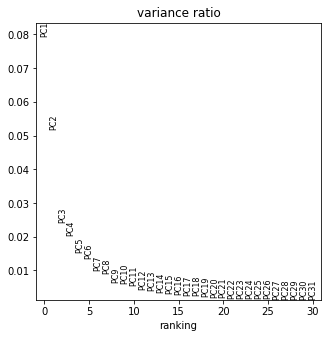

In [47]:
plt.rcParams['figure.figsize'] = (5, 5)
sc.pl.pca_overview(adata)

In [24]:
adata.write('./data/processed/pituitary_renamed_latest.h5ad')

In [17]:
adata.obs['louvain_r1'] = adata.obs['louvain_r1'].cat.rename_categories({'Melanotropes 2': 'Melanotropes'})

In [9]:
adata.obs['louvain_r1'].cat.categories

Index(['Somatotropes 1', 'Somatotropes 2', 'Somatotropes 3', 'Somatotropes 4',
       'Lactotropes 1', 'Somatotropes 5', 'Somatotropes 6', 'Corticotropes 1',
       'Somatotropes 7', 'Stem', 'Gonadotropes', 'Somatotropes 8',
       'Lactotropes 2', 'Endothelial', 'Macrophages', 'Corticotropes 2',
       'Vascular Meningeal', 'Thyrotropes', 'Pouf1 Progenitors',
       'Posterior Pituitary', 'Melanotropes 2', 'Proliferating Cells'],
      dtype='object')

In [18]:
adata.obs['louvain_r1'] = adata.obs['louvain_r1'].cat.reorder_categories(['Somatotropes 1', 'Somatotropes 2', 'Somatotropes 3', 'Somatotropes 4', 'Somatotropes 5', 'Somatotropes 6',\
                                                                          'Somatotropes 7', 'Somatotropes 8', 'Proliferating Cells', 'Lactotropes 1', 'Lactotropes 2', 'Corticotropes 1', 'Corticotropes 2', 'Melanotropes', 'Gonadotropes',\
                                                                          'Thyrotropes', 'Pouf1 Progenitors', 'Stem', 'Posterior Pituitary', 'Macrophages', 'Endothelial', 'Vascular Meningeal'])

In [7]:
adata.obs['louvain_r1'] = adata.obs['louvain_r1'].cat.rename_categories({'Cycling': 'Proliferating Cells', 'Progenitor': 'Pouf1 Progenitors'})

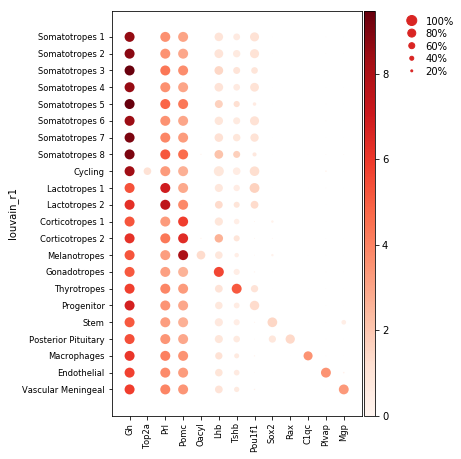

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[4.55, 0, 0.2, 0.5, 0.25])

In [7]:
sc.pl.dotplot(adata, var_names=['Gh', 'Top2a', 'Prl', 'Pomc', 'Oacyl', 'Lhb', 'Tshb', 'Pou1f1', 'Sox2', 'Rax', 'C1qc', 'Plvap', 'Mgp'], groupby='louvain_r1', save='_pituitary.svg')

In [9]:
adata.write('./results/adata_pituitary_batchcorr_renamed.h5ad')

In [5]:
#Create new Anndata object for use in MAST with non-batch corrected data as before
adata_test = adata.copy()
adata_test.X = adata.raw.X
adata_test.obs['n_genes'] = (adata_test.X > 0).sum(1) # recompute number of genes expressed per cell

In [11]:
from rpy2 import robjects
def mast_de_groups(adata, groupby, save):
    '''Compute differential expression with the MAST package by treatment covariate within clusters provided as "groupby" and export as excel file'''
    
    #if groupby not in ['louvain_final', 'louvain_three']:
    #    raise NotImplementedError("This function is only implemented to be used with 'louvain_final' and 'louvain_three' group labels")
    
    # Define R function to run MAST analysis
    robjects.r('''
        mast_de_r <- function(adata, obs, var, clusters, groupby){
            #Prepare data sets for SingleCellExperiment data structure conversion
            #obs['wellKey'] = row.names(obs)
            #var['primerid'] = row.names(var)
            print('Deploying to R...')
            #Convert to SingleCellExperiment type
            #sca <- FromMatrix(exprsArray=data_mat, fData=var)
            sca <- SceToSingleCellAssay(adata, class = "SingleCellAssay")
            #Compute Gene detection rate
            colData(sca)$n_genes = scale(colData(sca)$n_genes)

            #Create a vector that will hold all the DE results
            output <- vector("list", length(clusters))

            count <- 0
            print('Begin computation...')
            #Loop over all louvain clusters
            for (i in clusters){
                count <- count+1
                print(i)
                #Create data subsets which should be used for testing
                if (groupby=='louvain_final') {
                    sca_sub <- subset(sca, with(colData(sca), louvain_final==i))
                } else if (groupby=='louvain_r1') {
                    sca_sub <- subset(sca, with(colData(sca), louvain_r1==i))
                } else {
                    stop()
                }

                #Filter out non-expressed genes in the subset
                sca_sub <- sca_sub[rowSums(assay(sca_sub)) != 0, ]

                #Define & run hurdle model
                zlmCond <- zlm(formula = ~condition + n_genes, sca=sca_sub)
                summaryCond <- summary(zlmCond, doLRT='conditionStress')

                summaryDt <- summaryCond$datatable

                result <- merge(summaryDt[contrast=='conditionStress' & component=='H',.(primerid, `Pr(>Chisq)`)], #p-vals
                                 summaryDt[contrast=='conditionStress' & component=='logFC', .(primerid, coef)], #logFC coefficients
                                 by='primerid') 

                #Correct for multiple testing (FDR correction) and filtering
                result[,FDR:=p.adjust(`Pr(>Chisq)`, 'fdr')]
                result[,coef:=result[,coef]/log(2)]
                names(result) <- c("gene", "pval", "log2FC", "qval")
                result = result[order(result$qval),]

                output[[count]] <- result

            }
            return(output)
        }
    ''')
    
    mast_de = robjects.globalenv['mast_de_r']
    

    
    #Create new Anndata object for use in MAST with non-batch corrected data as before
    adata_test = adata.copy()
    adata_test.X = adata.raw.X
    adata_test.obs['n_genes'] = (adata_test.X > 0).sum(1) 
    
    obs = adata_test.obs
    var = adata_test.var
    clusters = list(adata_test.obs[groupby].cat.categories)
    
    expr_dict = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr_dict_stress = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr_dict_ctrl = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    for clust in adata_test.obs[groupby].cat.categories:
        expr = np.mean(adata_test[adata_test.obs[groupby] == clust].X, axis=0)
        expr_stress = np.mean(adata_test[(adata_test.obs['condition']=='Stress') & (adata_test.obs[groupby] == clust)].X, axis=0)
        expr_ctrl = np.mean(adata_test[(adata_test.obs['condition']=='Control') & (adata_test.obs[groupby] == clust)].X, axis=0)
        for i, gene in enumerate(adata_test.var.index):
            expr_dict[gene][clust] = expr[i]
            expr_dict_stress[gene][clust] = expr_stress[i]
            expr_dict_ctrl[gene][clust] = expr_ctrl[i]
    
    result = mast_de(adata_test, obs, var, clusters, groupby)
    result = {clusters[i]:datframe for i, datframe in enumerate(result)}
    
    writer = pd.ExcelWriter(save, engine='xlsxwriter')
    print('Number of significant DE genes:')    
    for clust in clusters:
        result[clust]['meanExpr'] = [expr_dict[gene][clust] for gene in result[clust]['gene'].values]
        result[clust]['meanExprStress'] = [expr_dict_stress[gene][clust] for gene in result[clust]['gene'].values]
        result[clust]['meanExprCtrl'] = [expr_dict_ctrl[gene][clust] for gene in result[clust]['gene'].values]
        result[clust].to_excel(writer,sheet_name=str(clust))
        print(clust+':', np.sum([result[clust]['qval']<0.05]))

    writer.save()

    return result

In [7]:
from rpy2 import robjects
def mast_de_bulk(adata, save):
    '''Compute differential expression with the MAST package by treatment covariate on the whole dataset'''
    
    #if groupby not in ['louvain_final', 'louvain_three']:
    #    raise NotImplementedError("This function is only implemented to be used with 'louvain_final' and 'louvain_three' group labels")
    
    # Define R function to run MAST analysis
    robjects.r('''
        mast_de_r <- function(adata, obs, var){
            #Prepare data sets for SingleCellExperiment data structure conversion
            #obs['wellKey'] = row.names(obs)
            #var['primerid'] = row.names(var)
            print('Deploying to R...')
            #Convert to SingleCellExperiment type
            #sca <- FromMatrix(exprsArray=data_mat, fData=var)
            sca <- SceToSingleCellAssay(adata, class = "SingleCellAssay")
            #Compute Gene detection rate
            colData(sca)$n_genes = scale(colData(sca)$n_genes)

            #Create a vector that will hold all the DE results

            count <- 0
            print('Begin computation...')
            #Define & run hurdle model
            zlmCond <- zlm(formula = ~condition + n_genes, sca=sca)
            summaryCond <- summary(zlmCond, doLRT='conditionStress')
            summaryDt <- summaryCond$datatable
            
            result <- merge(summaryDt[contrast=='conditionStress' & component=='H',.(primerid, `Pr(>Chisq)`)], #p-vals
                             summaryDt[contrast=='conditionStress' & component=='logFC', .(primerid, coef)], #logFC coefficients
                             by='primerid') 
                             
            #Correct for multiple testing (FDR correction) and filtering
            result[,FDR:=p.adjust(`Pr(>Chisq)`, 'fdr')]
            result[,coef:=result[,coef]/log(2)]
            names(result) <- c("gene", "pval", "log2FC", "qval")
            result = result[order(result$qval),]
            output <- result
                
            return(output)
        }
    ''')
    
    mast_de = robjects.globalenv['mast_de_r']
    

    
    #Create new Anndata object for use in MAST with non-batch corrected data as before
    adata_test = adata.copy()
    adata_test.X = adata.raw.X
    adata_test.obs['n_genes'] = (adata_test.X > 0).sum(1) 
    
    obs = adata_test.obs
    var = adata_test.var
    
    expr_dict = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr_dict_stress = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr_dict_ctrl = {adata_test.var.index[i]:{} for i in range(adata_test.shape[1])}
    expr = np.mean(adata_test.X, axis=0)
    expr_stress = np.mean(adata_test[(adata_test.obs['condition']=='Stress')].X, axis=0)
    expr_ctrl = np.mean(adata_test[(adata_test.obs['condition']=='Control')].X, axis=0)
    for i, gene in enumerate(adata_test.var.index):
        expr_dict[gene] = expr[i]
        expr_dict_stress[gene] = expr_stress[i]
        expr_dict_ctrl[gene] = expr_ctrl[i]
    
    result = mast_de(adata_test, obs, var)
    result
    writer = pd.ExcelWriter(save, engine='xlsxwriter')  
    result['meanExpr'] = [expr_dict[gene] for gene in result['gene'].values]
    result['meanExprStress'] = [expr_dict_stress[gene] for gene in result['gene'].values]
    result['meanExprCtrl'] = [expr_dict_ctrl[gene] for gene in result['gene'].values]
    result.to_excel(writer)

    writer.save()

    return result

In [8]:
de_bulk = mast_de_bulk(adata, save='./de_pituitary_bulk.xlsx')

[1] "Deploying to R..."
[1] "Begin computation..."


In [9]:
de = mast_de_groups(adata, groupby='louvain_r1', save='./de_pituitary_.xlsx')

[1] "Deploying to R..."
[1] "Begin computation..."
[1] "Somatotropes 1"
[1] "Somatotropes 2"
[1] "Somatotropes 3"
[1] "Somatotropes 4"
[1] "Somatotropes 5"
[1] "Somatotropes 6"
[1] "Somatotropes 7"
[1] "Somatotropes 8"
[1] "Cycling"
[1] "Lactotropes 1"
[1] "Lactotropes 2"
[1] "Corticotropes 1"
[1] "Corticotropes 2"
[1] "Melanotropes"
[1] "Gonadotropes"
[1] "Thyrotropes"
[1] "Progenitor"
[1] "Stem"
[1] "Posterior Pituitary"
[1] "Macrophages"
[1] "Endothelial"
[1] "Vascular Meningeal"
Number of significant DE genes:
Somatotropes 1: 590
Somatotropes 2: 306
Somatotropes 3: 77
Somatotropes 4: 143
Somatotropes 5: 17
Somatotropes 6: 146
Somatotropes 7: 31
Somatotropes 8: 3
Cycling: 0
Lactotropes 1: 208
Lactotropes 2: 5
Corticotropes 1: 67
Corticotropes 2: 5
Melanotropes: 1
Gonadotropes: 92
Thyrotropes: 0
Progenitor: 6
Stem: 15
Posterior Pituitary: 0
Macrophages: 9
Endothelial: 11
Vascular Meningeal: 3


In [7]:
marker_genes

{}

In [7]:
#Define a nice colour map for gene expression
import matplotlib
colors2 = plt.cm.Blues(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.8,0.9,20))
colorsComb = np.vstack([colors3, colors2])
mymap = matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

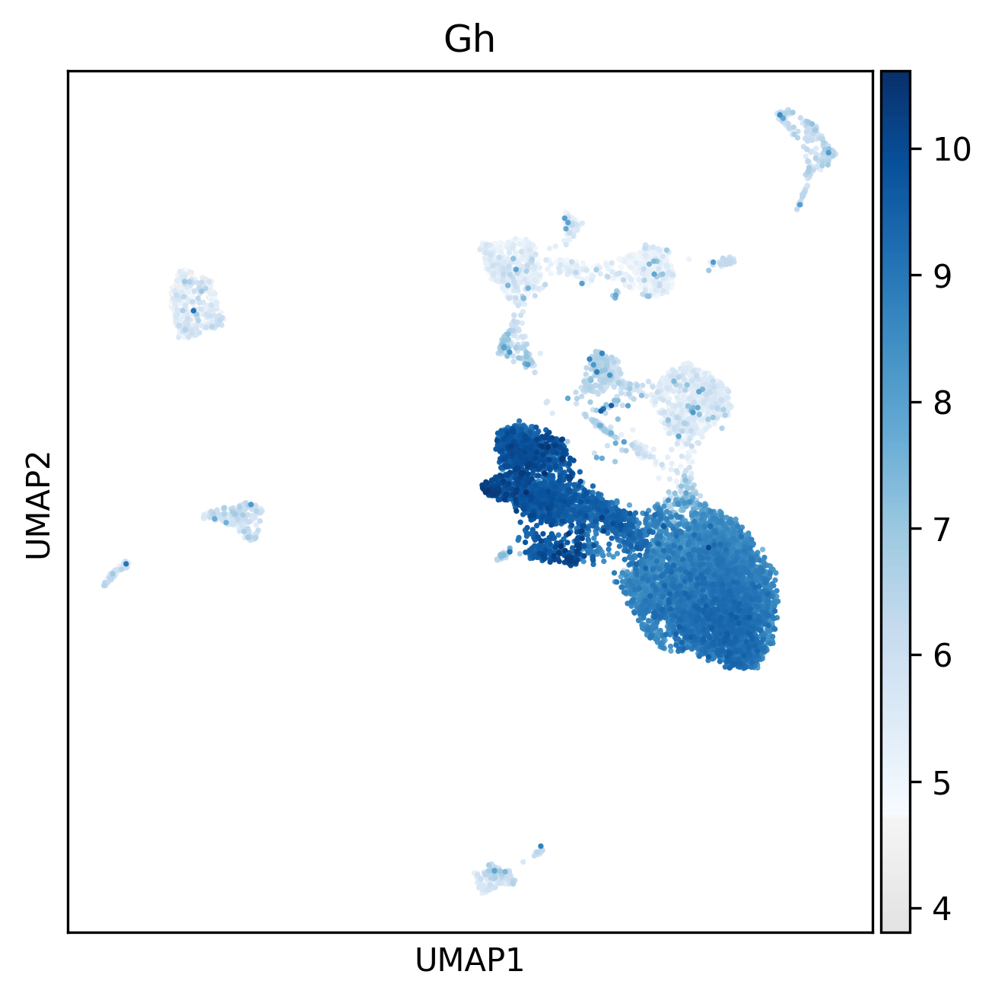

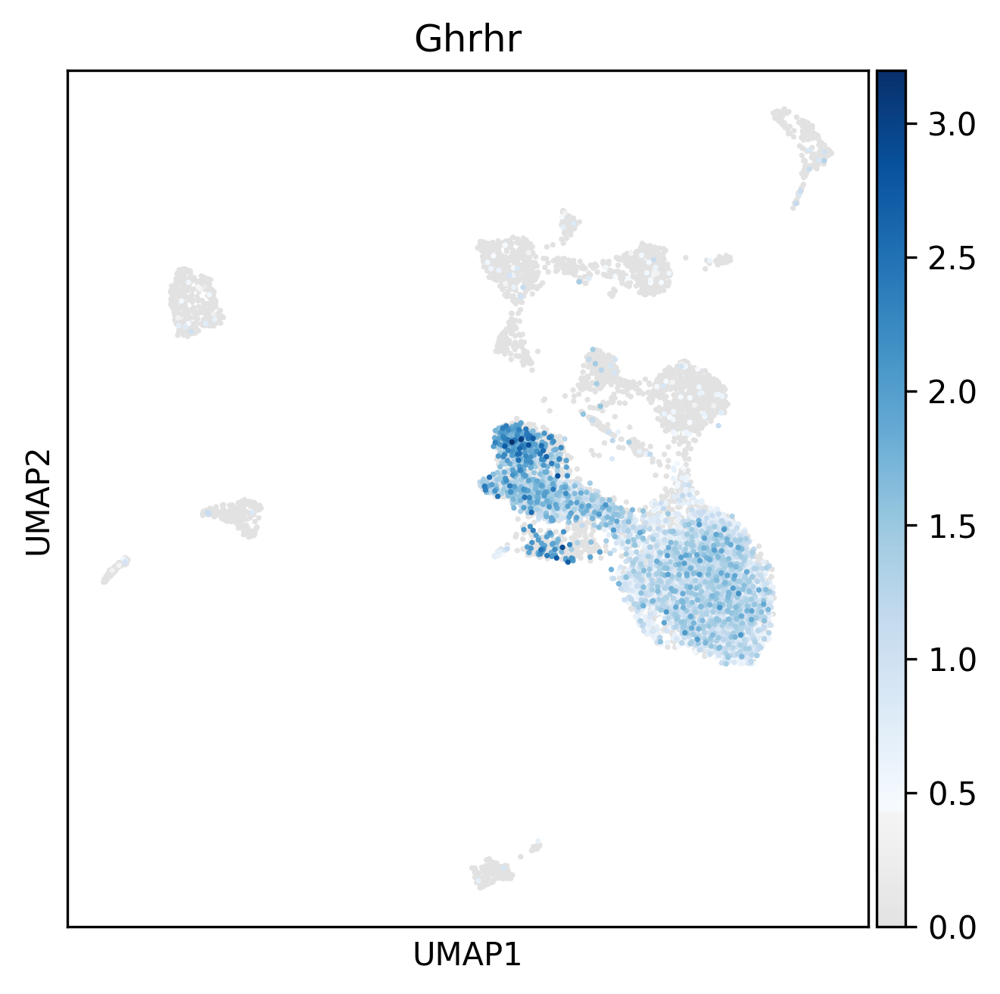

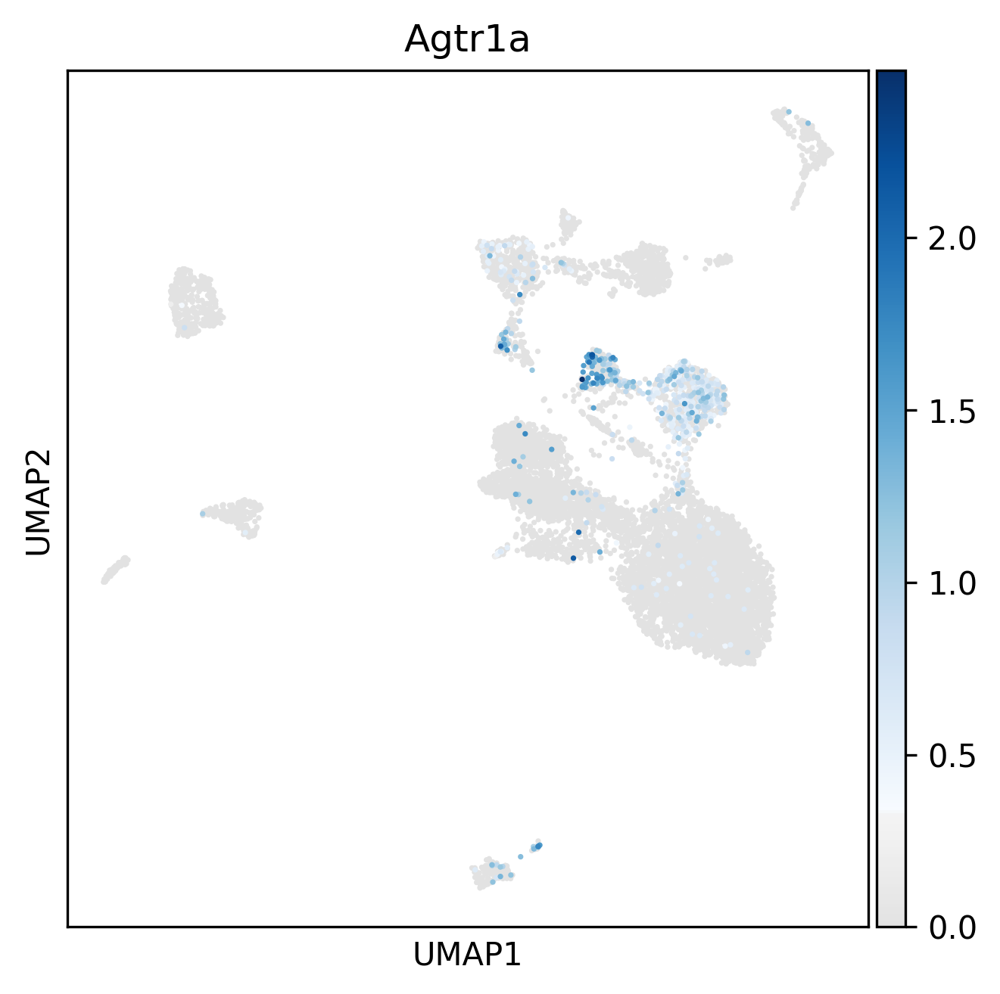

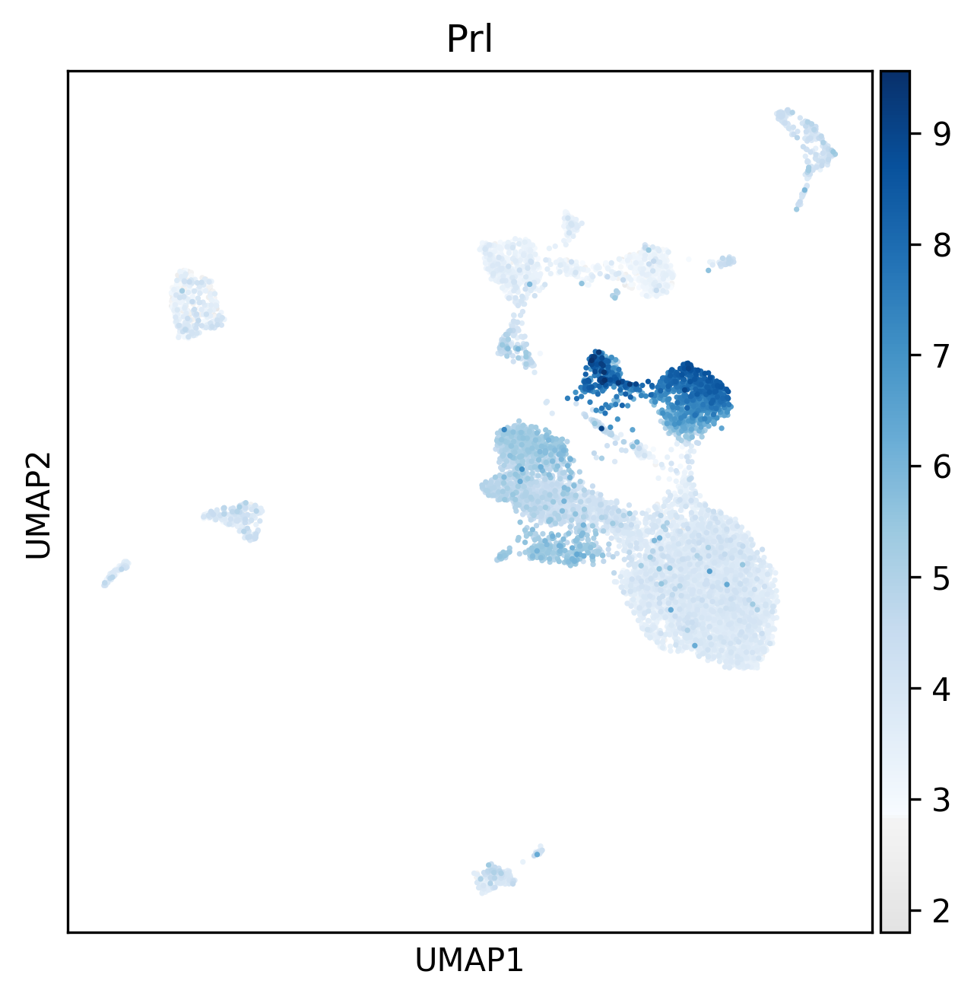

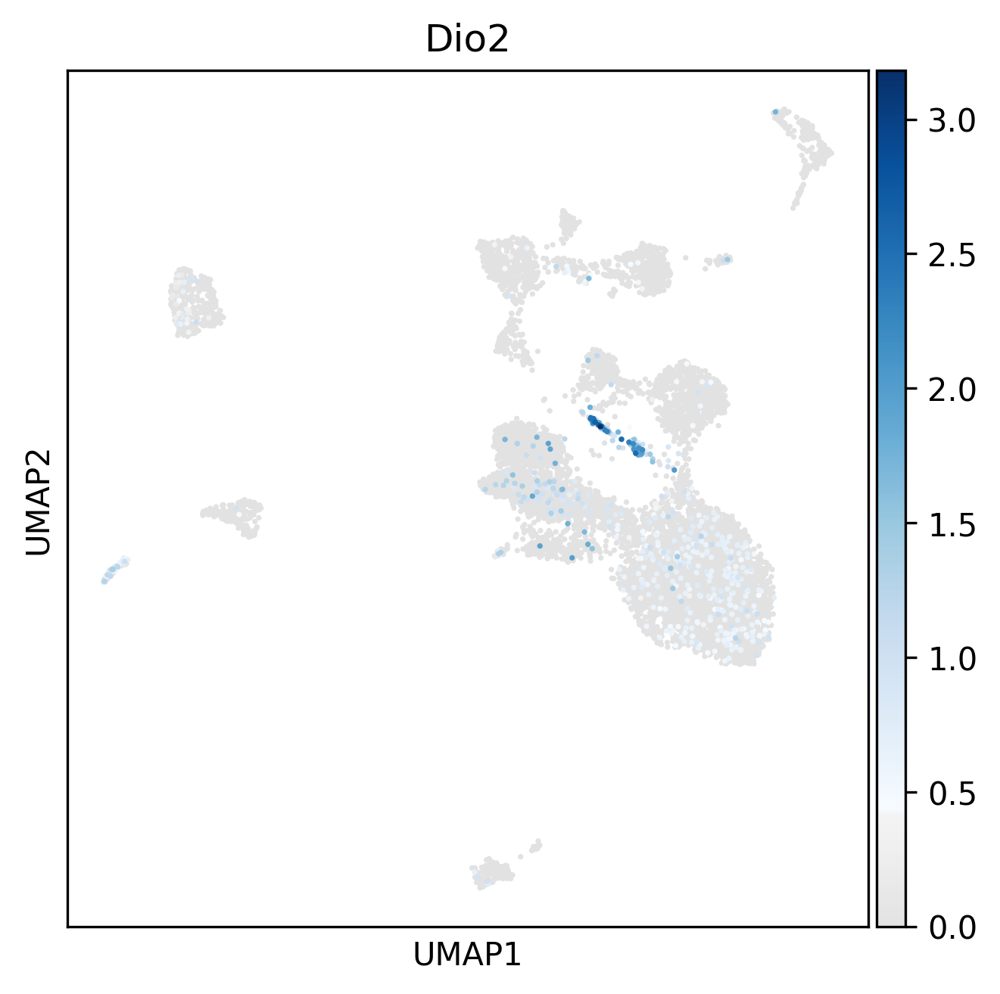

...

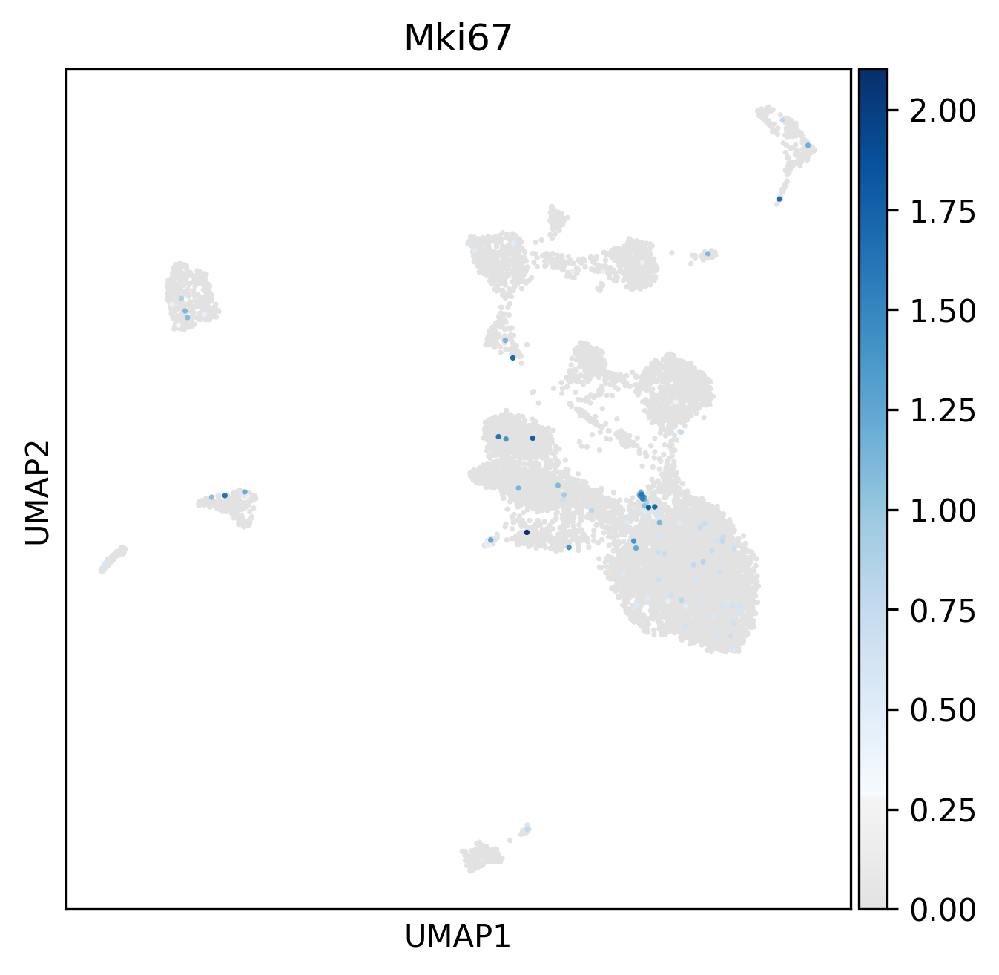

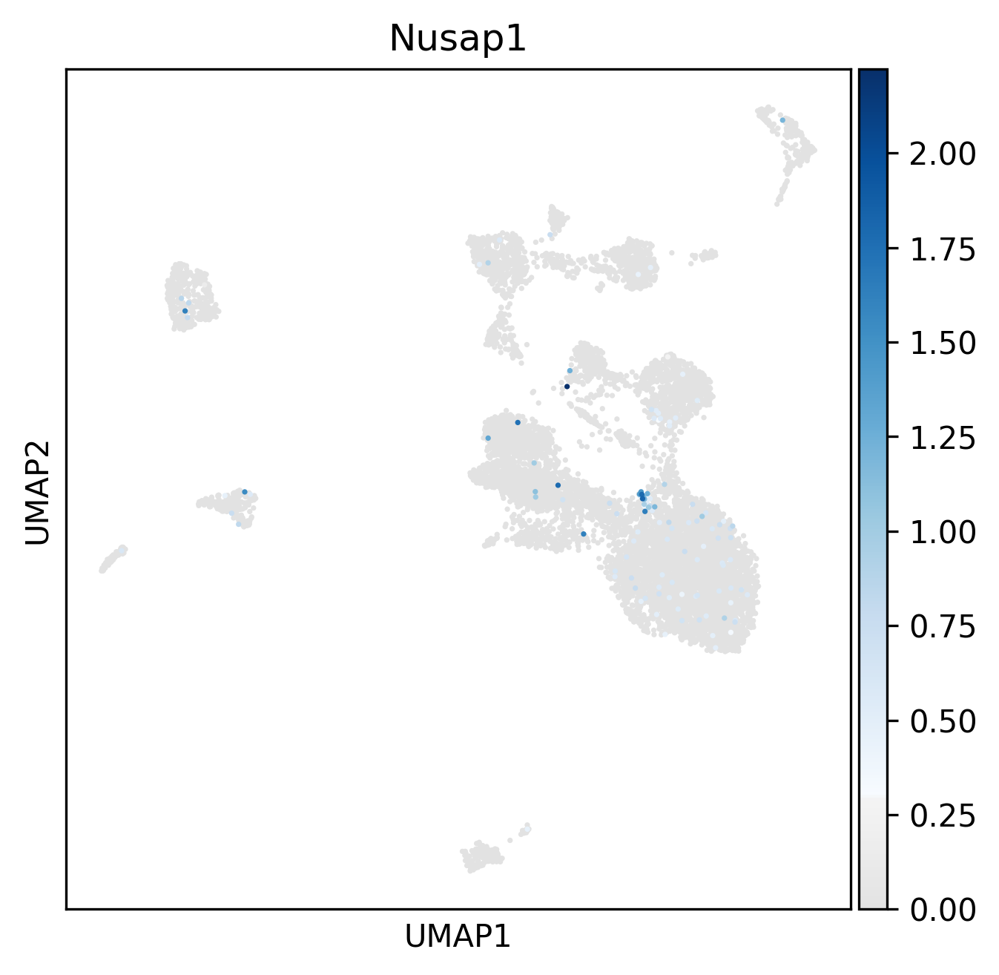

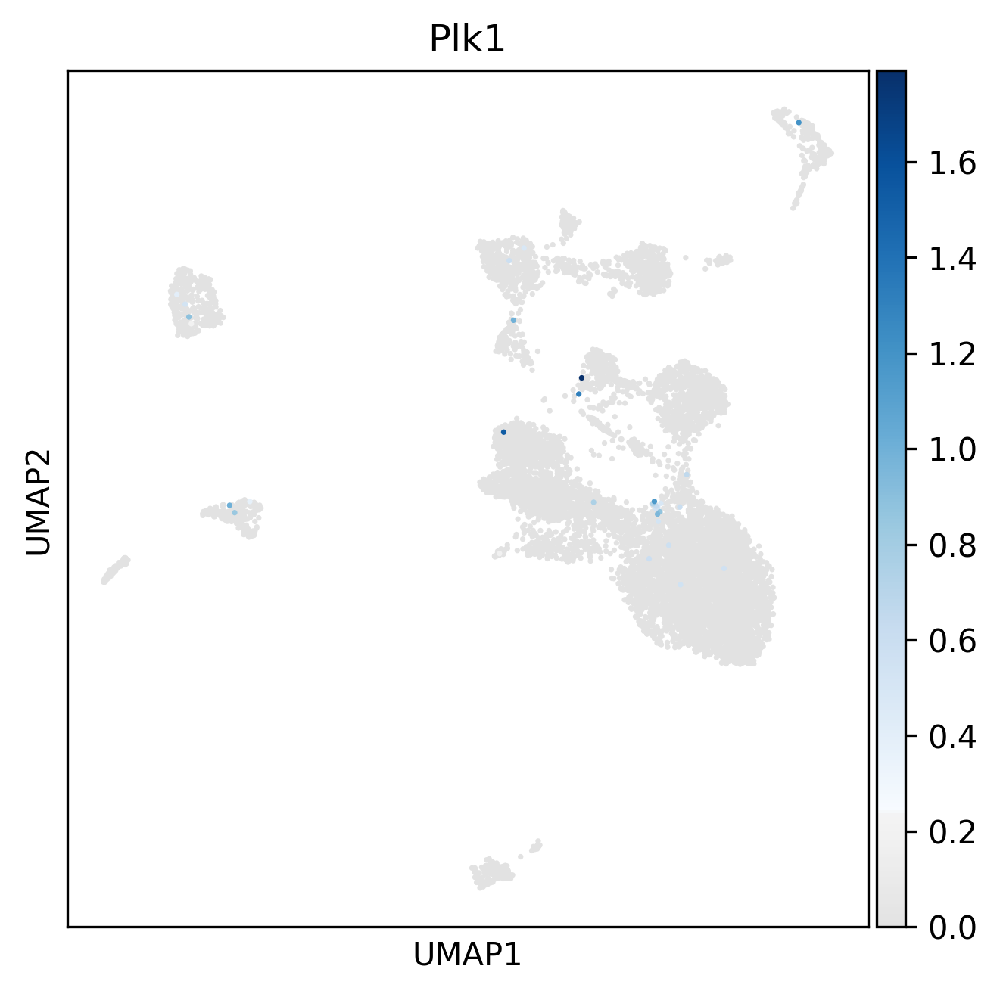

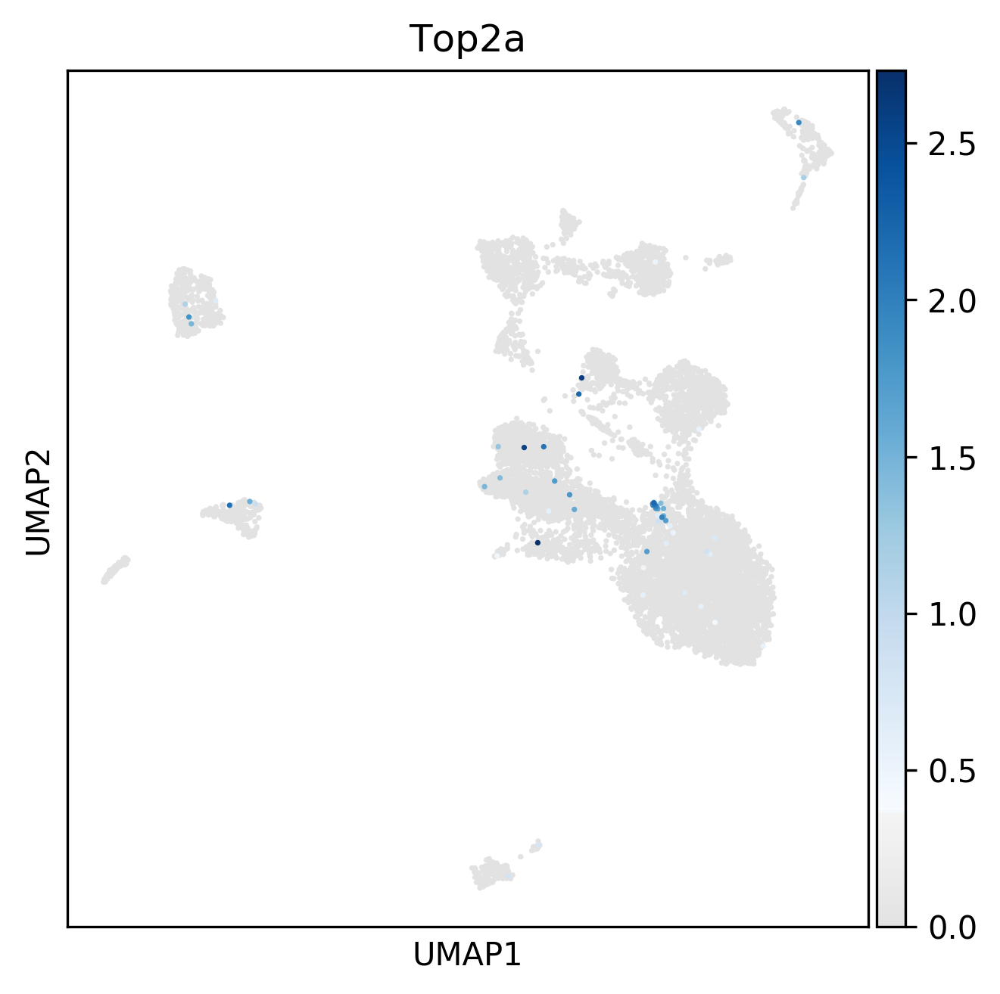

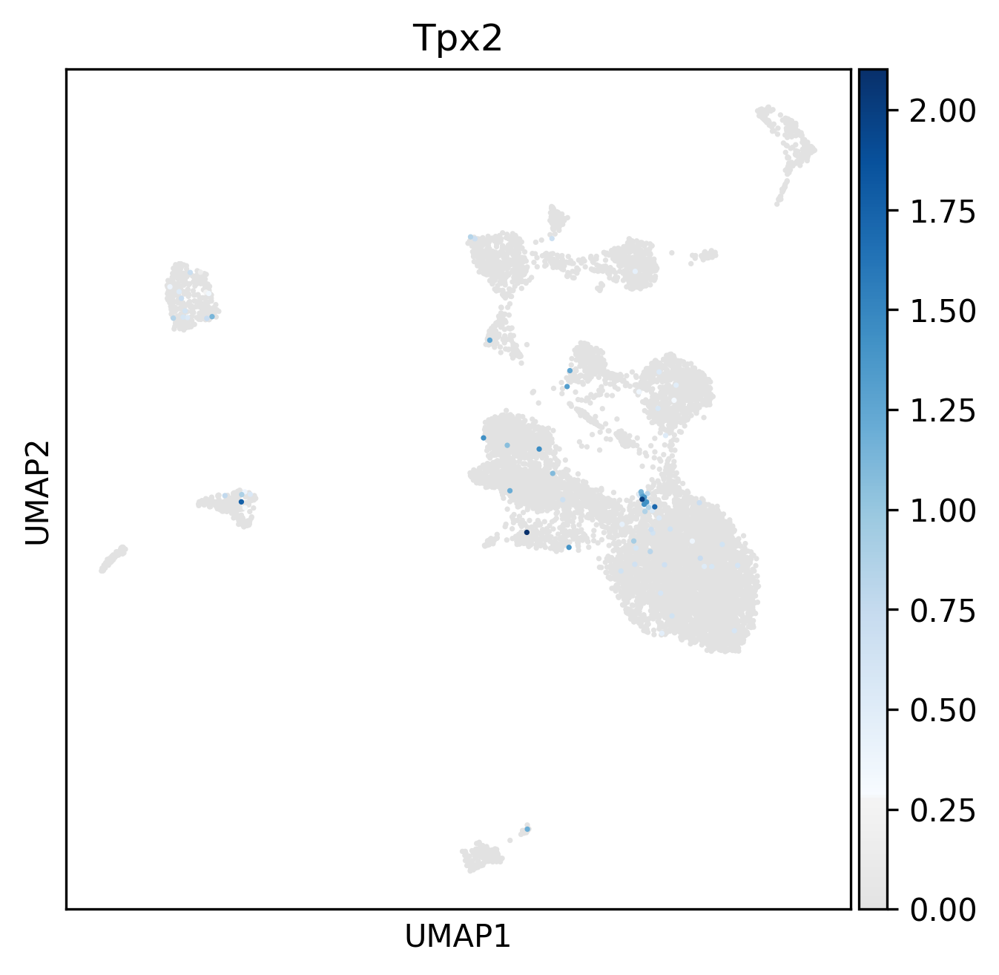

In [8]:
genes = []
for key, value in marker_genes.items():
    for gene in value:
        if gene in adata.var.index:
            genes.append(gene)
            sc.pl.umap(adata, color=gene, save='_pituitary_' + gene + '.png', color_map=mymap)

In [5]:
plt.rcParams['figure.figsize'] = (8, 8)
plt.rcParams['figure.dpi'] = 100

In [6]:
sc.tl.embedding_density(adata, basis='umap', groupby='condition')

computing density on 'umap'


Control    4963
Stress     4916
Name: condition, dtype: int64


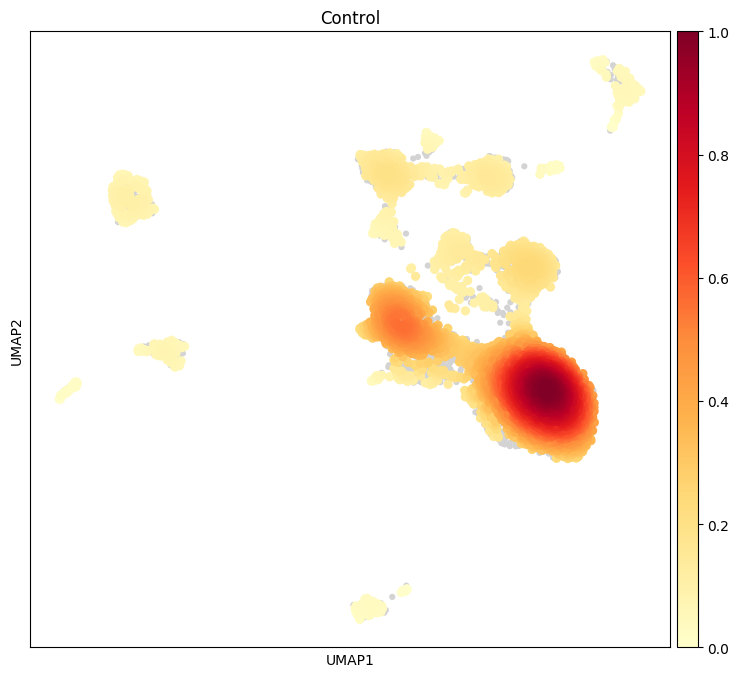

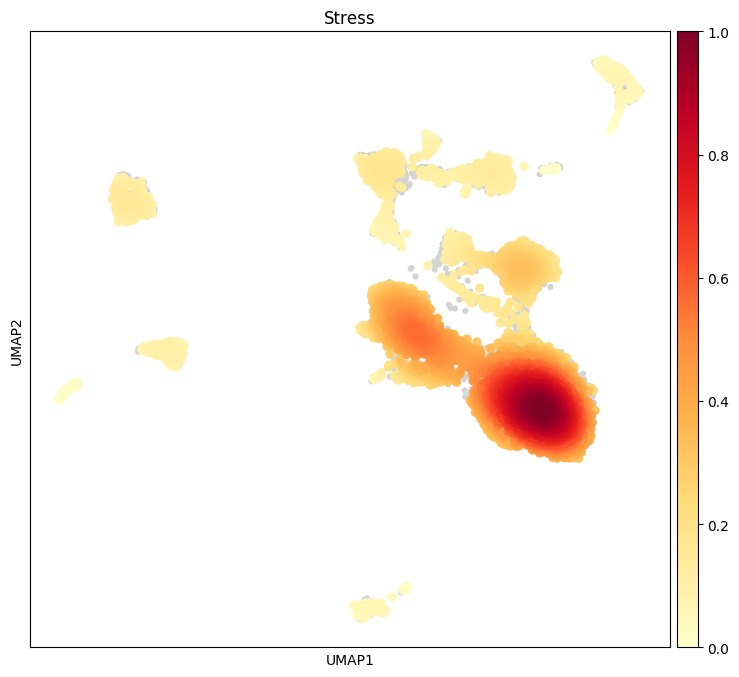

In [9]:
print(adata.obs['condition'].value_counts())
sc.pl.embedding_density(adata, basis='umap', key='umap_density_condition', group='Control', save='pituitary_control.png')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_condition', group='Stress', save='pituitary_stress.png')


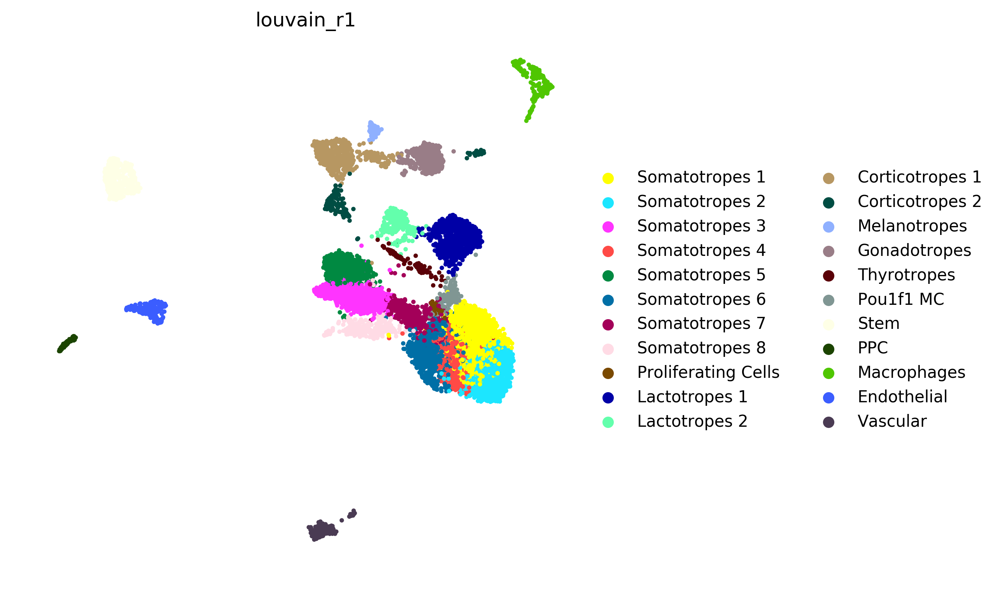

In [7]:
plt.rcParams['figure.figsize'] = (6,6)
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata, color='louvain_r1', frameon=False, size=30, palette=sc.pl.palettes.default_64, save='_pituitary_r1.png')

In [11]:
adata.write('../data/processed/pituitary_renamed_latest.h5ad')

In [12]:
adata_tmp = adata.copy()

In [13]:
adata_tmp.obs['louvain_r1'] = adata.obs['louvain_r1'].cat.remove_categories(['Proliferating Cells'])

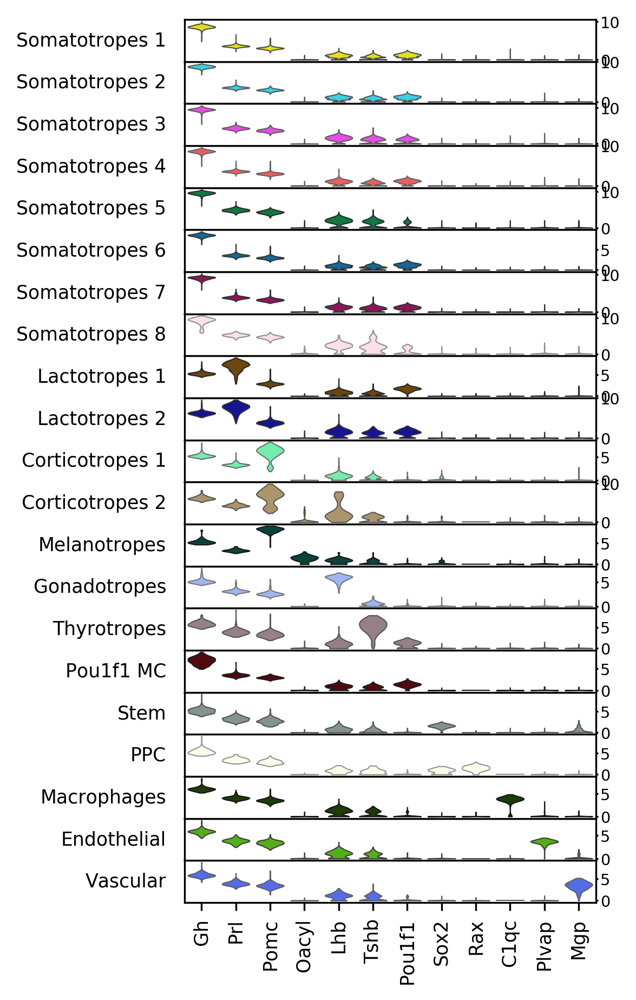

In [18]:
sc.pl.stacked_violin(adata_tmp, var_names=['Gh', 'Prl', 'Pomc', 'Oacyl', 'Lhb', 'Tshb', 'Pou1f1', 'Sox2', 'Rax', 'C1qc', 'Plvap', 'Mgp'],\
                     groupby='louvain_r1', dendrogram=False, save='_pituitary_stacked_vertical_colors.png', use_raw=True, swap_axes=False, row_palette=adata_tmp.uns['louvain_r1_colors'])

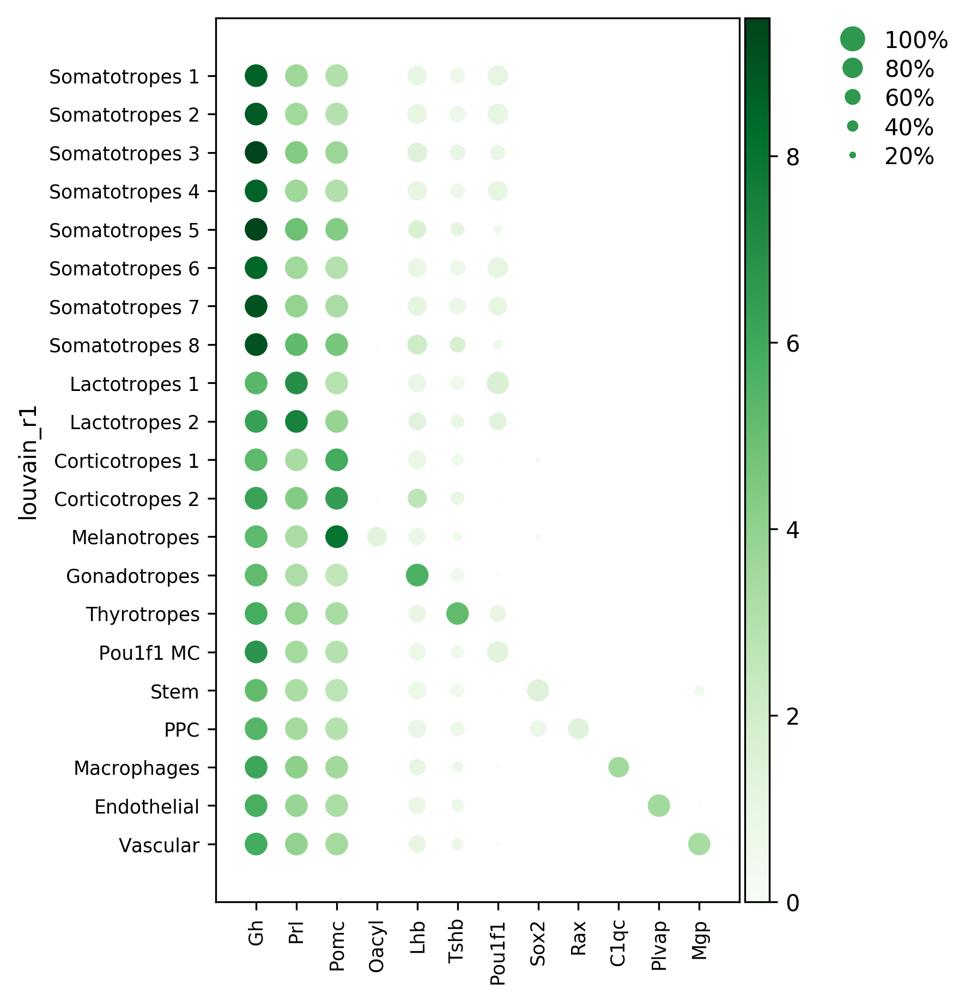

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[4.199999999999999, 0, 0.2, 0.5, 0.25])

In [16]:
plt.rcParams['figure.figsize'] = (8,8)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 10
sc.pl.dotplot(adata_tmp, var_names=['Gh', 'Prl', 'Pomc', 'Oacyl', 'Lhb', 'Tshb', 'Pou1f1', 'Sox2', 'Rax', 'C1qc', 'Plvap', 'Mgp'],\
                     groupby='louvain_r1', dendrogram=False, save='_final_pituitary.png', use_raw=True, color_map='Greens')#, swap_axes=False, row_palette=adata.uns['louvain_r1_colors'])

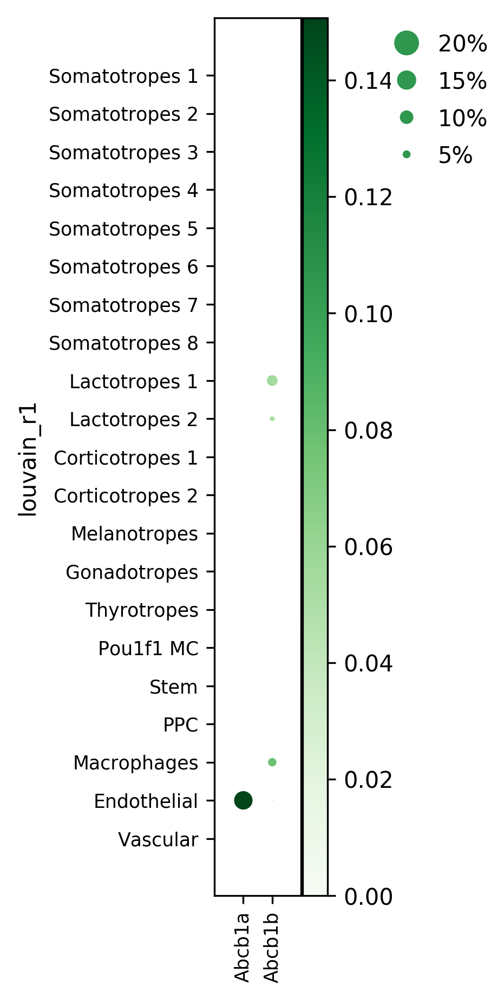

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.7, 0, 0.2, 0.5, 0.25])

In [21]:
sc.pl.dotplot(adata_tmp, var_names=['Abcb1a', 'Abcb1b'],\
                     groupby='louvain_r1', dendrogram=False, save='_pituitary_abcb.png', use_raw=True, color_map='Greens')

In [11]:
#Define a nice colour map for gene expression
import matplotlib
colors2 = plt.cm.Greens(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.8,0.9,20))
colorsComb = np.vstack([colors3, colors2])
mymap = matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

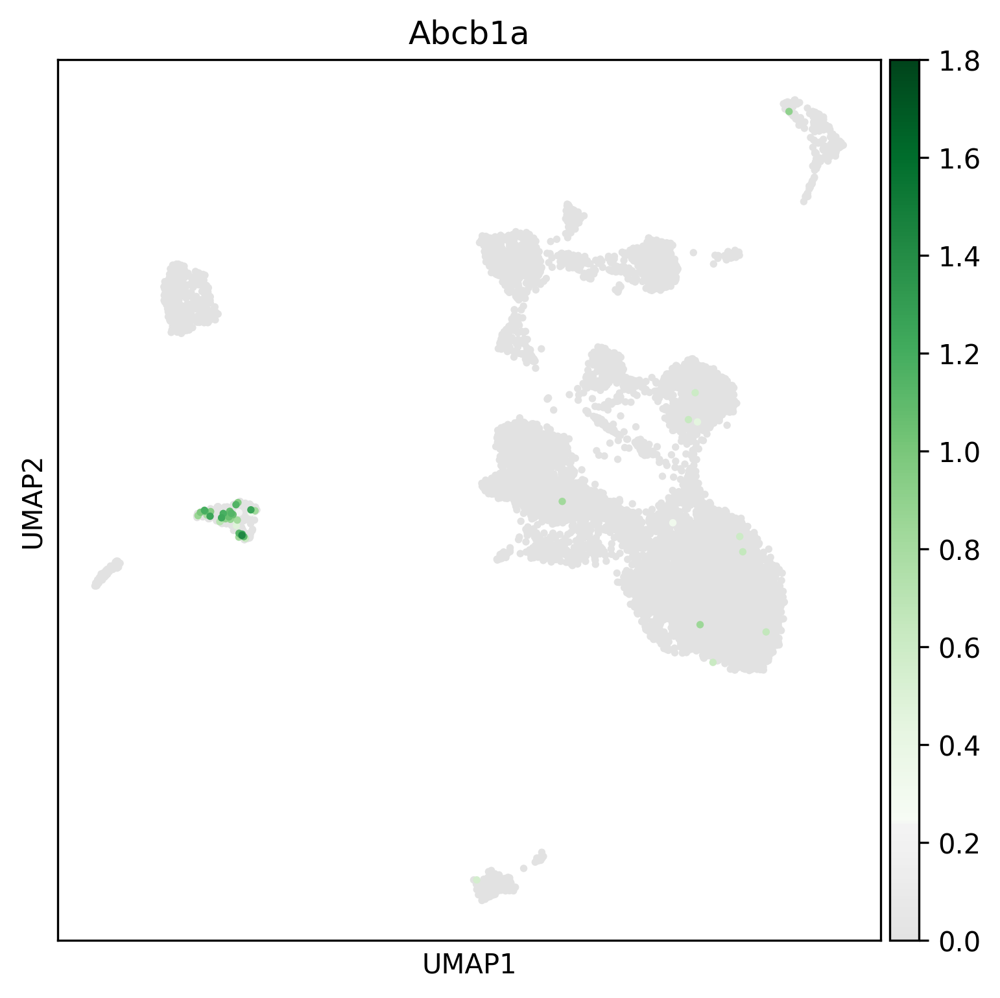

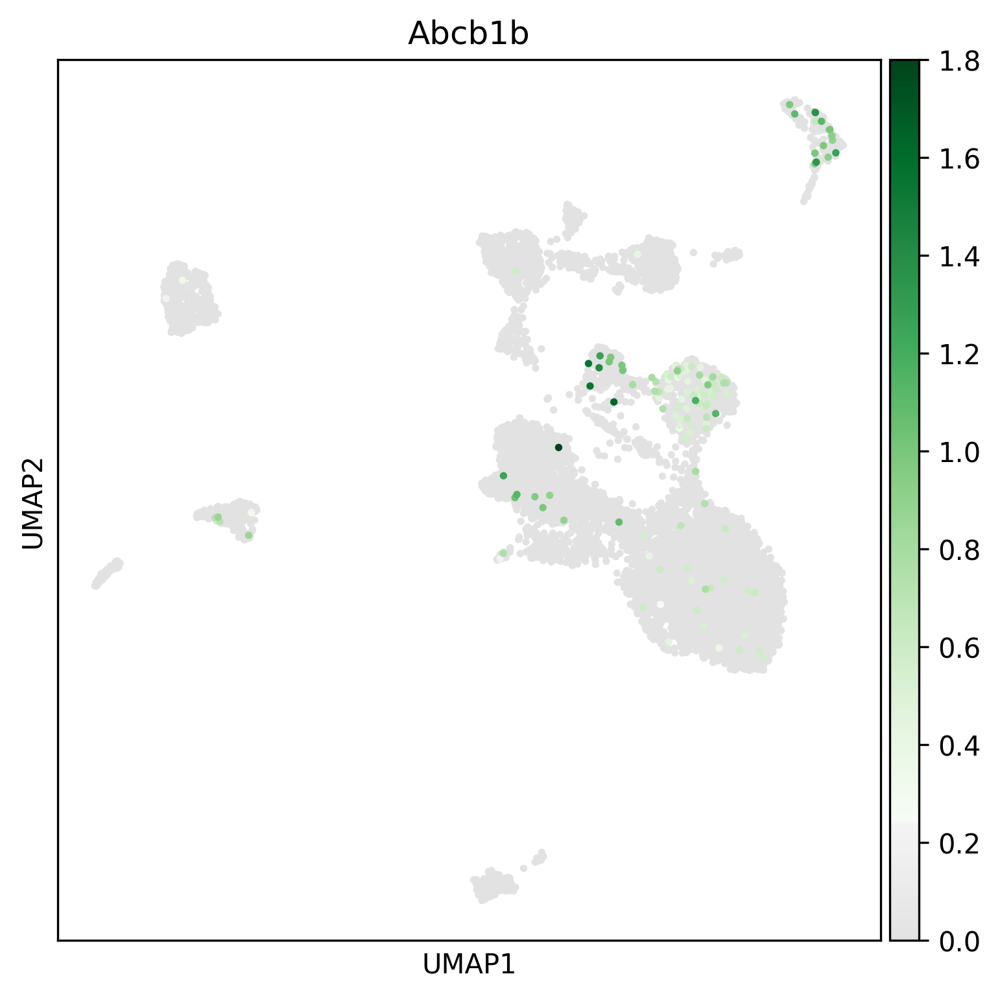

In [12]:
for gene in ['Abcb1a', 'Abcb1b']:
    if gene in adata.var.index:
        sc.pl.umap(adata, color=gene, save='_pituitary_' + gene + '.png', color_map=mymap, size=30, vmax=1.8)

In [21]:
adata.write('./data/processed/pituitary_renamed_latest.h5ad')